In [348]:
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
# import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

from matplotlib.font_manager import FontProperties
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
from tqdm import tqdm



## 資料介紹
### 天猫复购预测 - Tianchi 天池
[資料集連結](https://tianchi.aliyun.com/competition/entrance/231576/information)
- 每筆都是一次瀏覽

## EDA 
### 探索性資料分析

目的：
1. 基本的資料分布
2. 比較不同用戶分組的行為分布差異

<!--
1. 怎麼辨別某些人未來是不會購買的
2. 怎麼辨別哪些人未來是會回購的
3. 怎麼衡量用戶每次行為對購買機率的增減
-->

數值型屬性：
- event: `click`, `add_to_cart`, `add_to_favorite`, `purchase`

類別型屬性：
- user: `user_id`, `age_range`, `gender`, `*user_group`
    - `*user_group`: 
        1. repeat buyer (1.0)
        2. 1-time buyer (0.0)
        

- product: `item_id`, `cat_id`, `merchant_id`, `brand_id`
- time: `time_stamp`(month-day), `day`, `month`, `dayOfWeek`, `day_stamp`(day order)
- duration: 
    1. 06/01 - 09/30
    2. 10/11 - 11/10
    3. 11/11



EDA 大綱：
1. 各欄位項目分布
2. 每人總行為次數分布
    - 點擊
    - 加入願望清單
    - 加入購物車
    - 購買
        - 全站(不分組)
        - 不同性別組比較
        - 不同年齡組比較
        - 不同用戶組比較
            - 非大檔活動：6–9月 
            - 大檔活動前一個月：10/11 – 11/10
        
        
3. (1) 點擊：每人次數分布
    - 不重複商品
    - 不重複品類
    - 不重複商家
    - 不重複品牌
        - 全站(不分組)
        - 不同性別組比較
        - 不同年齡組比較
        - 不同用戶組比較
            - 非大檔活動：6–9月 
            - 大檔活動前一個月：10/11 – 11/10
        
        
3. (2) 加入願望清單：每人次數分布
    - 不重複商品
    - 不重複品類
    - 不重複商家
    - 不重複品牌
        - 全站(不分組)
        - 不同性別組比較
        - 不同年齡組比較
        - 不同用戶組比較
            - 非大檔活動：6–9月 
            - 大檔活動前一個月：10/11 – 11/10
        
        
3. (3) 加入購物車：每人次數分布
    - 不重複商品
    - 不重複品類
    - 不重複商家
    - 不重複品牌
        - 全站(不分組)
        - 不同性別組比較
        - 不同年齡組比較
        - 不同用戶組比較
            - 非大檔活動：6–9月 
            - 大檔活動前一個月：10/11 – 11/10
        
        
3. (4) 購買：每人次數分布
    - 不重複商品
    - 不重複品類
    - 不重複商家
    - 不重複品牌
        - 全站(不分組)
        - 不同性別組比較
        - 不同年齡組比較
        - 不同用戶組比較
            - 非大檔活動：6–9月 
            - 大檔活動前一個月：10/11 – 11/10
        

4. (1) 點擊：每人次數分布
    - 不重複天數
    - 不重複月數
    - 不重複週數
        - 全站(不分組)
        - 不同性別組比較
        - 不同年齡組比較
        - 不同用戶組比較
            - 非大檔活動：6–9月 
            - 大檔活動前一個月：10/11 – 11/10
        

4. (2) 加入願望清單：每人次數分布
    - 不重複天數
    - 不重複月數
    - 不重複週數
        - 全站(不分組)
        - 不同性別組比較
        - 不同年齡組比較
        - 不同用戶組比較
            - 非大檔活動：6–9月 
            - 大檔活動前一個月：10/11 – 11/10
        
        
4. (3) 加入購物車：每人次數分布
    - 不重複天數
    - 不重複月數
    - 不重複週數
        - 全站(不分組)
        - 不同性別組比較
        - 不同年齡組比較
        - 不同用戶組比較
            - 非大檔活動：6–9月 
            - 大檔活動前一個月：10/11 – 11/10
        
        
4. (4) 購買：每人次數分布
    - 不重複天數
    - 不重複月數
    - 不重複週數
        - 全站(不分組)
        - 不同性別組比較
        - 不同年齡組比較
        - 不同用戶組比較
            - 非大檔活動：6–9月 
            - 大檔活動前一個月：10/11 – 11/10
    
    
5. 隨時間變化趨勢圖
        - 全站 by{時間屬性} {行為屬性}分布
        - (分組)不同性別組 by{時間屬性} {行為屬性}分布
        - (分組)不同年齡組 by{時間屬性} {行為屬性}分布
            - {時間屬性}：月、日、星期幾
            - {行為屬性}：click, add_to_favorite, add_to_cart, purchase
                - 非大檔活動：6–9月 
                - 大檔活動前一個月：10/11 – 11/10


<!--
- `user_id` 
    - 每人瀏覽 `*hist`
        - 不重複商品數
        - 不重複品類數
        - 不重複商家數
        - 不重複品牌數
        - 不重複天數
        - 不重複月數
        - 不重複週數*
    - 每人加購物車 `*hist`
        - 不重複商品數
        - 不重複品類數
        - 不重複商家數
        - 不重複品牌數
        - 不重複天數
        - 不重複月數
        - 不重複週數*
    - 每人加入清單 `*hist`
        - 不重複商品數
        - 不重複品類數
        - 不重複商家數
        - 不重複品牌數
        - 不重複天數
        - 不重複月數
        - 不重複週數*
    - 每人購買 `*hist`
        - 不重複商品數
        - 不重複品類數
        - 不重複商家數
        - 不重複品牌數
        - 不重複天數
        - 不重複月數
        - 不重複週數*
        
- `age_range`
    - 每組瀏覽 `*hist (group compare)`
        - 不重複商品數
        - 不重複品類數
        - 不重複商家數
        - 不重複品牌數
        - 不重複天數
        - 不重複月數
        - 不重複週數*
    - 每組加購物車 `*hist (group compare)`
        - 不重複商品數
        - 不重複品類數
        - 不重複商家數
        - 不重複品牌數
        - 不重複天數
        - 不重複月數
        - 不重複週數*
    - 每組加入清單 `*hist (group compare)`
        - 不重複商品數
        - 不重複品類數
        - 不重複商家數
        - 不重複品牌數
        - 不重複天數
        - 不重複月數
        - 不重複週數*
    - 每組購買 `*hist (group compare)`
        - 不重複商品數
        - 不重複品類數
        - 不重複商家數
        - 不重複品牌數
        - 不重複天數
        - 不重複月數
        - 不重複週數*
- `gender`
    - 每組瀏覽 `*hist (group compare)`
        - 不重複商品數
        - 不重複品類數
        - 不重複商家數
        - 不重複品牌數
        - 不重複天數
        - 不重複月數
        - 不重複週數*
    - 每組加購物車 `*hist (group compare)`
        - 不重複商品數
        - 不重複品類數
        - 不重複商家數
        - 不重複品牌數
        - 不重複天數
        - 不重複月數
        - 不重複週數*
    - 每組加入清單 `*hist (group compare)`
        - 不重複商品數
        - 不重複品類數
        - 不重複商家數
        - 不重複品牌數
        - 不重複天數
        - 不重複月數
        - 不重複週數*
    - 每組購買 `*hist (group compare)`
        - 不重複商品數
        - 不重複品類數
        - 不重複商家數
        - 不重複品牌數
        - 不重複天數
        - 不重複月數
        - 不重複週數*
        
- distribution
    - by day
        - `click` x `age_gender`
        - `click` x `gender`
        - `add_to_wishlist` x `age_gender`
        - `add_to_wishlist` x `gender`
        - `add_to_cart` x `age_gender`
        - `add_to_cart` x `gender`
        - `purchase` x `age_gender`
        - `purchase` x `gender`
    - by dayOfWeek
        - `click` x `age_gender`
        - `click` x `gender`
        - `add_to_wishlist` x `age_gender`
        - `add_to_wishlist` x `gender`
        - `add_to_cart` x `age_gender`
        - `add_to_cart` x `gender`
        - `purchase` x `age_gender`
        - `purchase` x `gender`
    - by month
        - `click` x `age_gender`
        - `click` x `gender`
        - `add_to_wishlist` x `age_gender`
        - `add_to_wishlist` x `gender`
        - `add_to_cart` x `age_gender`
        - `add_to_cart` x `gender`
        - `purchase` x `age_gender`
        - `purchase` x `gender`
    - by weekOfYear
        - `click` x `age_gender`
        - `click` x `gender`
        - `add_to_wishlist` x `age_gender`
        - `add_to_wishlist` x `gender`
        - `add_to_cart` x `age_gender`
        - `add_to_cart` x `gender`
        - `purchase` x `age_gender`
        - `purchase` x `gender`

- trend (action proportion)
    - 4-month (June - Sept.)
        - x `user_groups`
        - x `age_range`
        - x `gender`
    - 1-month
        - x `user_groups`
        - x `age_range`
        - x `gender`
    - 1-week
        - x `user_groups`
        - x `age_range`
        - x `gender`
-->


### Data Preprocessing

In [ ]:
# IMPORT
fm1_user = pd.read_csv('data_format1/user_info_format1.csv')
fm1_userLog = pd.read_csv('data_format1/user_log_format1.csv')  
# 0: click, 1: add-to-cart, 2: purchase and 3: add-to-favourite
fm1_userLog.rename(columns={'seller_id': 'merchant_id'}, inplace=True)

# MERGE
df = pd.merge(fm1_userLog, fm1_user, on=['user_id'], how='left')
df.isnull().sum() / len(df)  # brand_id, age_range, gender 有缺值

# MISSING DATA PROCESSING
sorted(df['brand_id'].value_counts().index)[-10:] 
# > fillna('other')
df['age_range'].value_counts() / df['age_range'].value_counts().sum()
# > fillna(3.0)
df['gender'].value_counts() / df['gender'].value_counts().sum()
# > fillna(0.0)
df['brand_id'] = df['brand_id'].fillna('other')
df['age_range'] = df['age_range'].fillna(3.0)
df['gender'] = df['gender'].fillna(0.0)
df.isnull().sum() / len(df)  # 確認無缺值

# SPLIT ACTION ATTRIBUTES
action_list = ['click','add_to_cart','purchase','add_to_favorite']
dummy_actionType = pd.get_dummies(df['action_type'])
dummy_actionType.columns = action_list
df = pd.concat([df, dummy_actionType], axis=1)
df.drop(['action_type'], axis=1, inplace=True)
# 每個事件都至少代表1次點擊
df['click'] = np.where(df['click']==0, 1, df['click'])

# SPLIT TIME ATTRIBUTES
df['day'] = df['time_stamp'].apply(lambda x: int(str(x)[-2:]))
df['month'] = df['time_stamp'].apply(lambda x: int(str(x)[:-2]))
df['dayOfWeek'] = df['time_stamp'].apply(lambda x: dt.datetime(2019, int(str(x)[:-2]), int(str(x)[-2:])).weekday()+1)
df['day_stamp'] = df['time_stamp'].apply(lambda x: dt.datetime(2019, int(str(x)[:-2]), int(str(x)[-2:])).timetuple().tm_yday - dt.datetime(2019,5,11).timetuple().tm_yday)
df['weekOfYear'] = df['time_stamp'].apply(lambda x: dt.datetime.strftime(dt.datetime(2019, int(str(x)[:-2]), int(str(x)[-2:])), '%U'))

# SAVE
df.to_pickle('TMall_for_user_states_define_transformed.pkl')


### Add features
- `user_groups`
    1. repeat buyer (1.0)
    2. 1-time buyer (0.0)
- durations
    1. 06/01 - 09/30
    2. 10/11 - 11/10
    3. 11/11
    

In [398]:
df = pd.read_pickle('TMall_for_user_states_define_transformed.pkl')
df['click'] = np.where(df['click']==0, 1, df['click'])
repeatbuyers = df.groupby('user_id')['purchase'].sum().reset_index()
repeatbuyers = repeatbuyers[repeatbuyers['purchase']>1].user_id.unique()
repeatbuyers.shape
df['user_groups'] = np.where(df['user_id'].isin(repeatbuyers), 1.0, 0.0)
df.shape
df.head()

df_usual = df[(df['time_stamp']>=601) & (df['time_stamp']<=930)]
df_usual.shape
df_usual.head()
df_event = df[(df['time_stamp']>=1012) & (df['time_stamp']<1111)]
df_event.shape
df_event.head()
df_1111 = df[df['time_stamp']==1111]
df_1111.shape
df_1111.head()



(387252,)

(54925330, 18)

,user_id,item_id,cat_id,merchant_id,brand_id,time_stamp,age_range,gender,click,add_to_cart,purchase,add_to_favorite,day,month,dayOfWeek,day_stamp,weekOfYear,user_groups
0,328862,323294,833,2882,2661,829,6.0,1.0,1,0,0,0,29,8,4,110,34,1.0
1,328862,844400,1271,2882,2661,829,6.0,1.0,1,0,0,0,29,8,4,110,34,1.0
2,328862,575153,1271,2882,2661,829,6.0,1.0,1,0,0,0,29,8,4,110,34,1.0
3,328862,996875,1271,2882,2661,829,6.0,1.0,1,0,0,0,29,8,4,110,34,1.0
4,328862,1086186,1271,1253,1049,829,6.0,1.0,1,0,0,0,29,8,4,110,34,1.0


(22858823, 18)

,user_id,item_id,cat_id,merchant_id,brand_id,time_stamp,age_range,gender,click,add_to_cart,purchase,add_to_favorite,day,month,dayOfWeek,day_stamp,weekOfYear,user_groups
0,328862,323294,833,2882,2661,829,6.0,1.0,1,0,0,0,29,8,4,110,34,1.0
1,328862,844400,1271,2882,2661,829,6.0,1.0,1,0,0,0,29,8,4,110,34,1.0
2,328862,575153,1271,2882,2661,829,6.0,1.0,1,0,0,0,29,8,4,110,34,1.0
3,328862,996875,1271,2882,2661,829,6.0,1.0,1,0,0,0,29,8,4,110,34,1.0
4,328862,1086186,1271,1253,1049,829,6.0,1.0,1,0,0,0,29,8,4,110,34,1.0


(16437521, 18)

,user_id,item_id,cat_id,merchant_id,brand_id,time_stamp,age_range,gender,click,add_to_cart,purchase,add_to_favorite,day,month,dayOfWeek,day_stamp,weekOfYear,user_groups
56,328862,313424,614,4043,7178,1013,6.0,1.0,1,0,0,0,13,10,7,155,41,1.0
62,328862,313424,614,4043,7178,1013,6.0,1.0,1,0,0,0,13,10,7,155,41,1.0
126,328862,842597,1553,1138,4104,1102,6.0,1.0,1,0,0,0,2,11,6,175,43,1.0
127,328862,217103,389,1138,4104,1102,6.0,1.0,1,0,0,0,2,11,6,175,43,1.0
128,328862,431009,1577,3828,1446,1102,6.0,1.0,1,0,0,0,2,11,6,175,43,1.0


(10582633, 18)

,user_id,item_id,cat_id,merchant_id,brand_id,time_stamp,age_range,gender,click,add_to_cart,purchase,add_to_favorite,day,month,dayOfWeek,day_stamp,weekOfYear,user_groups
171,328862,406349,1280,2700,5476,1111,6.0,1.0,1,0,0,0,11,11,1,184,45,1.0
172,328862,406349,1280,2700,5476,1111,6.0,1.0,1,0,0,0,11,11,1,184,45,1.0
173,328862,807126,1181,1963,6109,1111,6.0,1.0,1,0,0,0,11,11,1,184,45,1.0
174,328862,406349,1280,2700,5476,1111,6.0,1.0,0,0,1,0,11,11,1,184,45,1.0
175,328862,406349,1280,2700,5476,1111,6.0,1.0,1,0,0,0,11,11,1,184,45,1.0


In [515]:
pd.DataFrame({
    'Field': df.columns,
    'Data Type': [str(type(df[x].values[0])).split("'")[1] for x in df.columns],
    'Description': ['Unique identifier of each user', 
                    'Unique identifier of each product', 
                    'Unique identifier of each category', 
                    'Unique identifier of each merchant', 
                    'Unique identifier of each brand', 
                    'The date at which the user acts (format: mmdd)', 
                    'User age range', 'User gender',
                    'click times', 'add_to_cart times', 'purchase times', 'add_to_favorite times', 
                    'day', 'month', 'dayOfWeek', 'day_stamp', 'weekOfYear', 'user label of repeat buyer'],
    'Sample value': [df[x].values[0] for x in df.columns]
}).to_csv('thesis-data-desc-TMall.csv')


In [488]:
print('\n=== Count uniques ===')
for col in df.columns:
    print(f'{col} has unique values: {df[col].unique().shape[0]}')


<class 'pandas.core.frame.DataFrame'>
Int64Index: 54925330 entries, 0 to 54925329
Data columns (total 18 columns):
 #   Column           Dtype  
---  ------           -----  
 0   user_id          int64  
 1   item_id          int64  
 2   cat_id           int64  
 3   merchant_id      int64  
 4   brand_id         object 
 5   time_stamp       int64  
 6   age_range        float64
 7   gender           float64
 8   click            uint8  
 9   add_to_cart      uint8  
 10  purchase         uint8  
 11  add_to_favorite  uint8  
 12  day              int64  
 13  month            int64  
 14  dayOfWeek        int64  
 15  day_stamp        int64  
 16  weekOfYear       object 
 17  user_groups      float64
dtypes: float64(3), int64(9), object(2), uint8(4)
memory usage: 6.3+ GB

=== Count uniques ===
user_id has unique values: 424170
item_id has unique values: 1090390
cat_id has unique values: 1658
merchant_id has unique values: 4995
brand_id has unique values: 8444
time_stamp has unique

#### 所有繪圖 functions

In [493]:
amount_list = ['click','add_to_cart','add_to_favorite','purchase']

def value_count_bar(by):
    
    """
    input:
        - by: column to groupby
        
    process:
        generate barplot of 3 durations:
            - usual
            - 1 month before 11/11
            - 11/11
    
    output:
        the compare plot between durations
        
    """

    fig, axes = plt.subplots(1, figsize=(8, 4))
    axes.bar(df_usual.drop_duplicates(subset=['user_id',by])[by].value_counts(normalize=True).index, 
             df_usual.drop_duplicates(subset=['user_id',by])[by].value_counts(normalize=True).values, 
             alpha=0.5)
    axes.bar(df_event.drop_duplicates(subset=['user_id',by])[by].value_counts(normalize=True).index, 
             df_event.drop_duplicates(subset=['user_id',by])[by].value_counts(normalize=True).values, 
             alpha=0.5)
    axes.bar(df_1111.drop_duplicates(subset=['user_id',by])[by].value_counts(normalize=True).index, 
             df_1111.drop_duplicates(subset=['user_id',by])[by].value_counts(normalize=True).values, 
             alpha=0.5)
    axes.legend(['usual','1 month before 11/11', '11/11'])
    axes.title.set_text(f'{by} - value counts (Normalized)')
    plt.show()
    
    fig, axes = plt.subplots(1, 3, figsize=(24, 6))
    axes[0].bar(df_usual.drop_duplicates(subset=['user_id',by])[by].value_counts().index, 
                df_usual.drop_duplicates(subset=['user_id',by])[by].value_counts().values)
    axes[0].title.set_text(f'{by} - usual')
    axes[1].bar(df_event.drop_duplicates(subset=['user_id',by])[by].value_counts().index, 
                df_event.drop_duplicates(subset=['user_id',by])[by].value_counts().values)
    axes[1].title.set_text(f'{by} - 1 month before 11/11')
    axes[2].bar(df_1111.drop_duplicates(subset=['user_id',by])[by].value_counts().index, 
                df_1111.drop_duplicates(subset=['user_id',by])[by].value_counts().values)
    axes[2].title.set_text(f'{by} - 11/11')
    plt.show()
    

    
def simplify(df, by, amount):
    
    """
    input:
        - df: dataframe for plotting
        - by: column to groupby
        - amount: kind of action, {'click', 'add_to_favorite', 'add_to_cart', 'purchase'}
        
    process:
        filter out the last 95% column(by) items as 'other'
    
    output:
        the proportion dataframe with only the largest 5% items, and 'other' 95% items
        
    """
    
    tmp = df[df[amount]>0][by].value_counts(normalize=True).reset_index()
    tmp = tmp[tmp[by]>np.quantile(tmp[by], 0.95)]  # 只取前 5% 多的項目印出，其餘都以 other 表示
    tmp.loc[len(tmp)] = ['other', 1-tmp[by].sum()] 
    return tmp

    
def value_count_pie(by):
    
    """
    input:
        - by: column to groupby
        
    process:
        generate pie chart of 3 durations:
            - usual
            - 1 month before 11/11
            - 11/11
    
    output:
        3-row pie chart subplots
        
    """
    amount_list = ['click','add_to_favorite','add_to_cart','purchase']
    fig, axes = plt.subplots(3, len(amount_list), figsize=(21, 21))
    fig.tight_layout(pad=5.0)
    
    for _id in range(len(amount_list)):
        
        tmp = simplify(df_usual, by, amount_list[_id])
        axes[0][_id].pie(tmp[by], labels=tmp['index'], autopct='%1.1f%%')
        axes[0][_id].title.set_text(f'{by} - usual - {amount_list[_id]}')
        tmp = simplify(df_event, by, amount_list[_id])
        axes[1][_id].pie(tmp[by], labels=tmp['index'], autopct='%1.1f%%')
        axes[1][_id].title.set_text(f'{by} - event - {amount_list[_id]}')
        tmp = simplify(df_1111, by, amount_list[_id])
        axes[2][_id].pie(tmp[by], labels=tmp['index'], autopct='%1.1f%%')
        axes[2][_id].title.set_text(f'{by} - 1111 - {amount_list[_id]}')
    
    plt.show()
    

def hist_subplot(df, by, amount):
    
    """
    input:
        - df: dataframe for plotting
        - by: column to groupby, default=['user_id']
        - amount: y-value to plot
        
    process:
        groups = [None, 'gender', 'age_range', 'user_groups']
        
    
    output:
        subplots(len(amount), len(groups), figsize=(15, 15))
    
    """

    if amount == 'event':
        event = ['click','add_to_favorite','add_to_cart','purchase']
        
    elif amount == 'product':
        event = ['item_id','cat_id','merchant_id','brand_id']
    
    elif amount == 'time':
        event = ['day_stamp','month','weekOfYear']
        
    groups = [None, 'gender', 'age_range', 'user_groups']

    fig, axs = plt.subplots(len(event), len(groups), figsize=(15,15))
    fig.tight_layout(pad=5.0)
    
    for row in range(len(event)):
        for col in range(len(groups)):
            
            if groups[col] == None:
                if amount == 'event':
                    tmp = df.groupby(by)[event[row]].sum().reset_index()
                else:
                    tmp = df.groupby(by)[event[row]].nunique().reset_index()
                bins_range = min(int(round(tmp[event[row]].max(), 0)), 100)
                axs[row][col].hist(tmp[event[row]], bins=range(0, bins_range, 1), alpha=0.5, density=True)
                axs[row][col].title.set_text(f'{by} - {event[row]} - {groups[col]}')
                
            else:
                for g in df[groups[col]].value_counts().index:
                    if amount == 'event':
                        tmp = df[df[groups[col]]==g].groupby(by)[event[row]].sum().reset_index()
                    else:
                        tmp = df[df[groups[col]]==g].groupby(by)[event[row]].nunique().reset_index()
                    bins_range = min(int(round(tmp[event[row]].max(), 0)), 100)
                    axs[row][col].hist(tmp[event[row]], bins=range(0, bins_range, 1), alpha=0.5, density=True)
                    axs[row][col].title.set_text(f'{by} - {event[row]} - {groups[col]}')

                axs[row][col].legend(df[groups[col]].value_counts().index)
                
    plt.show()
    
    
def bar_subplot_time(df, by, amount):
    
    groups = [None, 'gender', 'age_range', 'user_groups']
    
    if amount == 'event':
        amount_list = ['click','add_to_favorite','add_to_cart','purchase']       
        fig, axes = plt.subplots(len(amount_list), len(groups), figsize=(20,20))
        fig.tight_layout(pad = 5.0)
        for i, ele in enumerate(amount_list):
            for j, group in enumerate(groups):
                if group == None:
                    df.groupby([by])[ele].sum().plot(ax=axes[i, j], kind='bar')
                else:
                    for g in df[group].value_counts().index:
                        tmp = df[df[group]==g].groupby([by])[ele].sum().reset_index()
                        tmp[ele] = tmp[ele] / tmp[ele].sum()
                        axes[i, j].bar(tmp[by], tmp[ele], alpha=0.5)
                    
                axes[i, j].title.set_text(f'{by} - {ele} - {group}')

                
    elif amount == 'product':
        amount_list = ['item_id','cat_id','merchant_id','brand_id']
        fig, axes = plt.subplots(len(amount_list), len(groups), figsize=(20,20))
        fig.tight_layout(pad = 5.0)
        for i, ele in enumerate(amount_list):
            for j, group in enumerate(groups):
                if group == None:
                    df.groupby([by])[ele].nunique().plot(ax=axes[i, j], kind='bar')
                else:
                    for g in df[group].value_counts().index:
                        tmp = df[df[group]==g].groupby([by])[ele].nunique().reset_index()
                        tmp[ele] = tmp[ele] / tmp[ele].sum()
                        axes[i, j].bar(tmp[by], tmp[ele], alpha=0.5)
                        
                    axes[i, j].legend(df[group].value_counts().index)
                    axes[i, j].title.set_text(f'{by} - {ele} - {group}')

    plt.show()

    
def trend_lineplot(time_attr, amount):
    
    group_list = ['gender','age_range','user_groups']
    df_durations = [df_usual, df_event]
    duration_names = ['usual', 'event']

    fig, axes = plt.subplots(len(group_list), len(df_durations), figsize=(20, 16))
    fig.tight_layout(pad = 5.0)

    for g in range(len(group_list)):
        for _df in range(len(df_durations)):
            for cate in df_durations[_df][group_list[g]].value_counts().index:
                (df_durations[_df][df_durations[_df][group_list[g]]==cate].groupby(time_attr)[amount].sum() / df_durations[_df][df_durations[_df][group_list[g]]==cate][amount].sum()).plot(ax=axes[g, _df])
            axes[g, _df].title.set_text(f'{duration_names[_df]} - {time_attr} - {amount} - {group_list[g]}')
            axes[g, _df].legend(df_usual[group_list[g]].value_counts().index)

    plt.show();



##### EDA

### 1. 各欄位項目分布
- 動作數

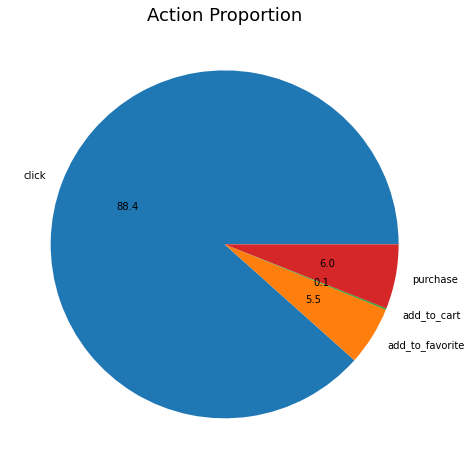

In [484]:
plt.figure(figsize=(8, 8))
plt.pie(df[['click','add_to_favorite','add_to_cart','purchase']].sum().values, 
        labels=df[['click','add_to_favorite','add_to_cart','purchase']].sum().index, 
        autopct='%1.1f')
plt.title('Action Proportion', fontsize=18)
plt.show();


- 單品

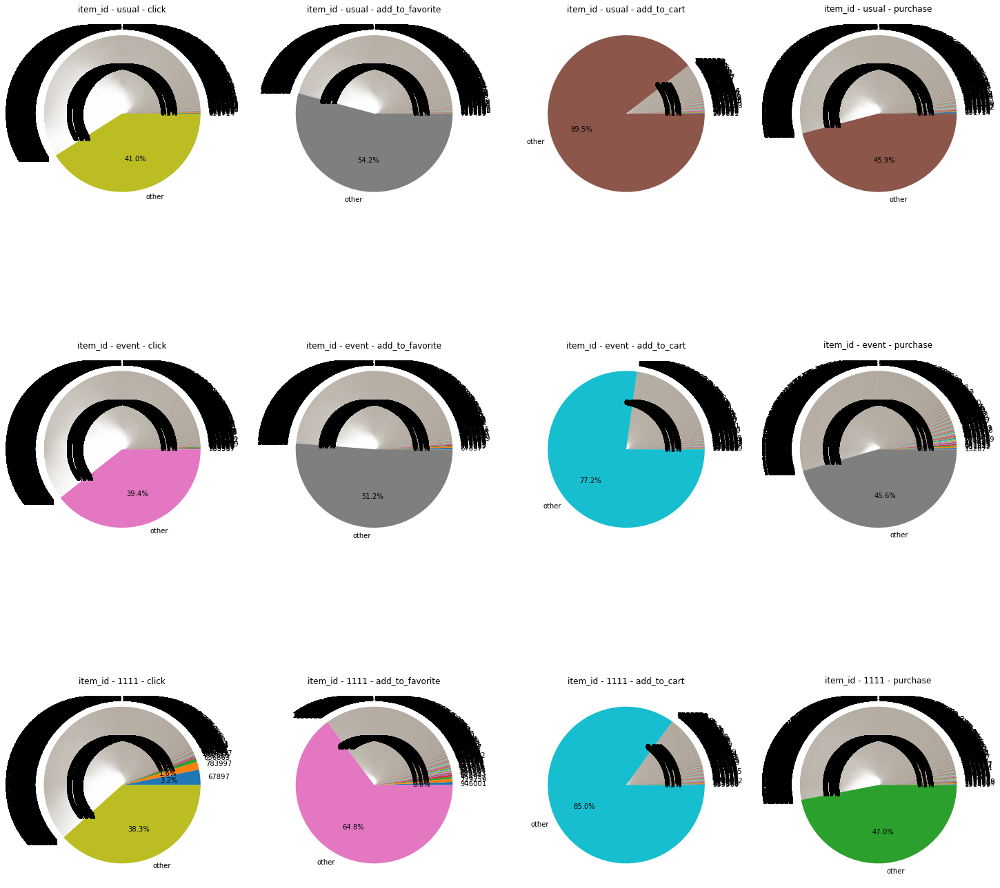

In [498]:
value_count_pie(by='item_id')


> 從圖表做出解讀與推測：（仍需與業務單位進行認知確認）

```
[單品面]
    1. 平時(6-9月)，前5%單品佔 59.9% 流量
    2. 雙11一個月前(10/11-11/10)，前5%單品佔 62.1% 流量
    3. 雙11當天，前5%單品佔 62.2% 流量；且更相對集中前幾名單品

```

- 品類

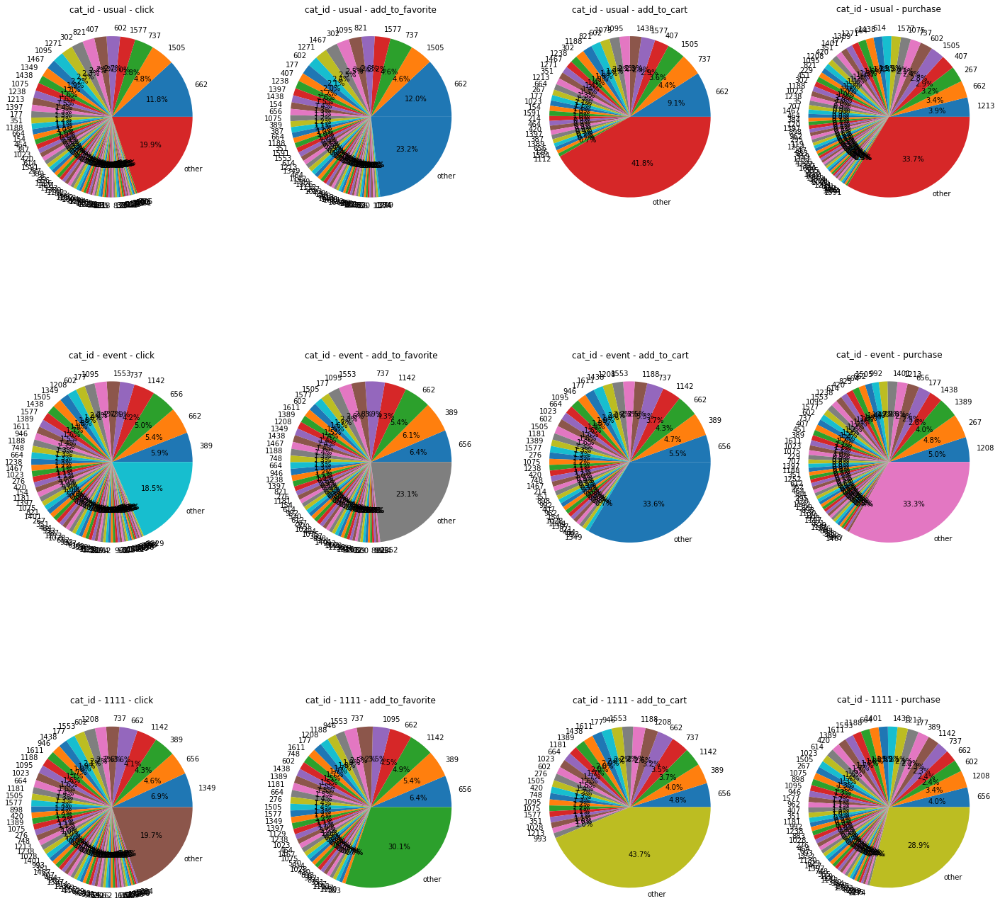

In [499]:
value_count_pie(by='cat_id')


- 商家

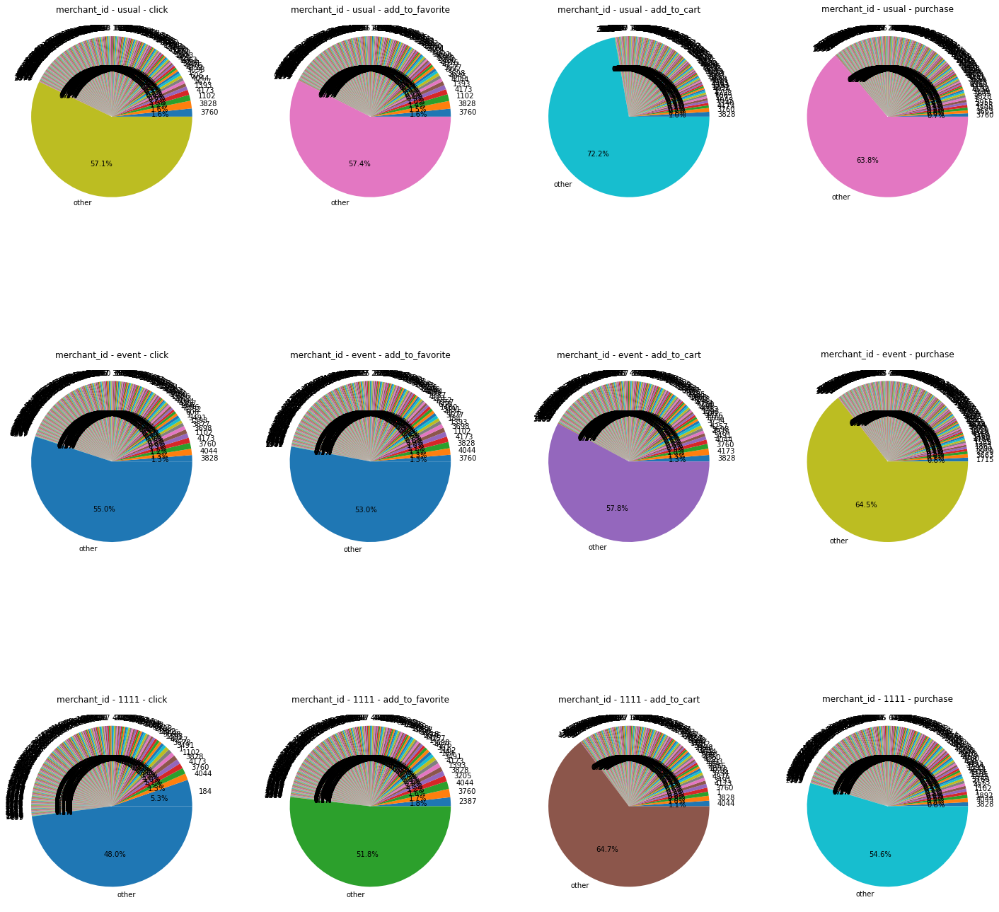

In [500]:
value_count_pie(by='merchant_id')


- 品牌

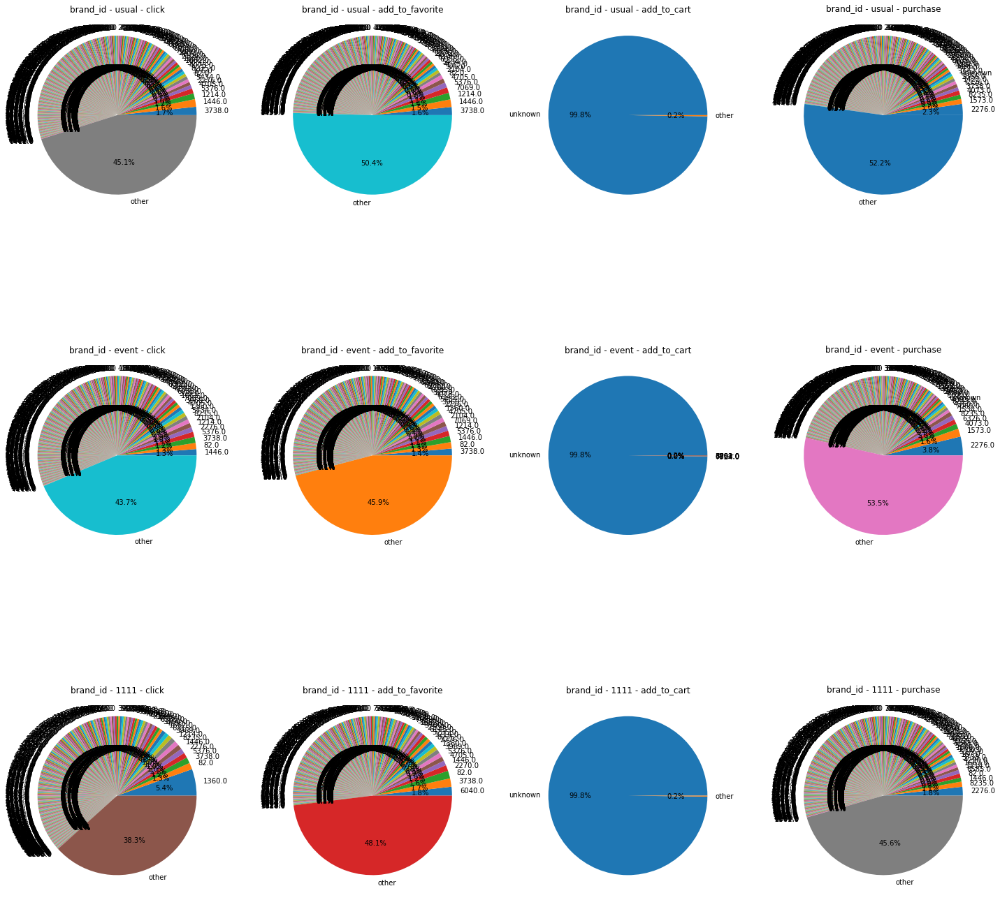

In [501]:
value_count_pie(by='brand_id')


- 年齡層

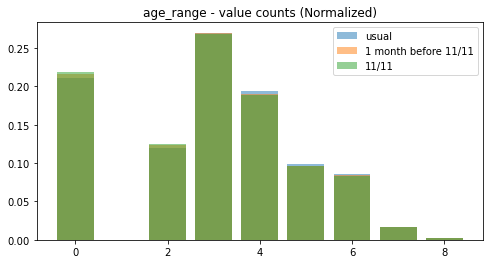

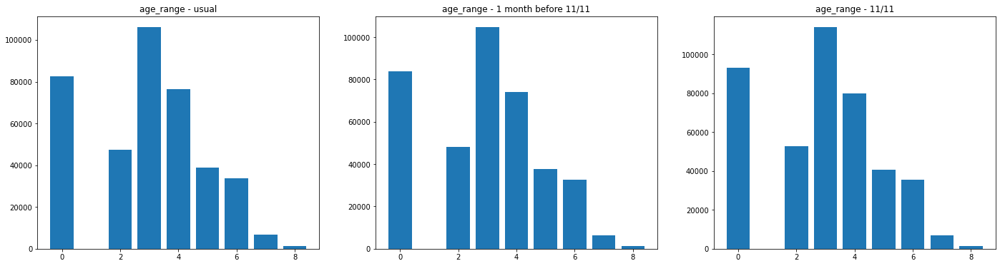

In [490]:
value_count_bar(by='age_range')


- 性別

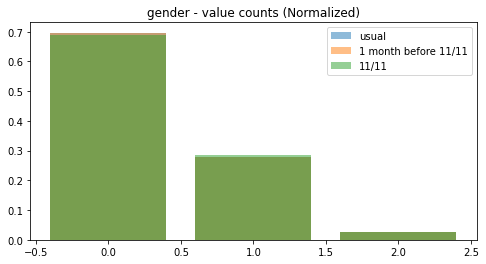

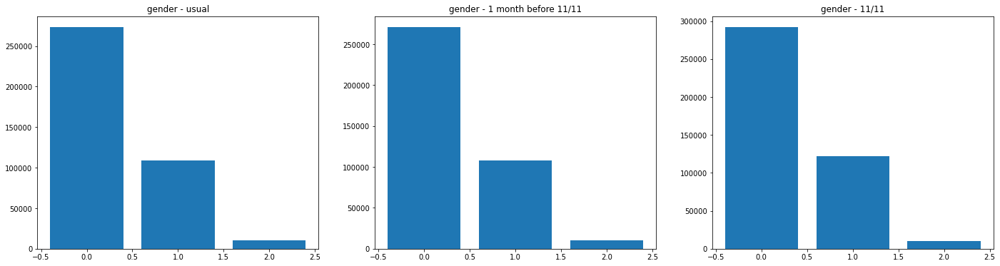

In [491]:
value_count_bar(by='gender')


- 用戶分組
    - 0: 只購買過一次
    - 1: 購買過兩次以上

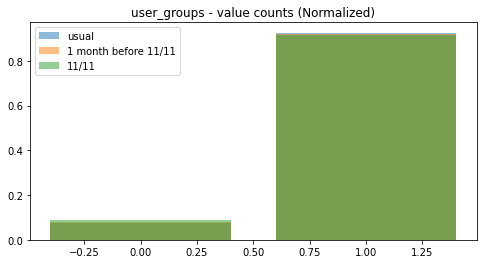

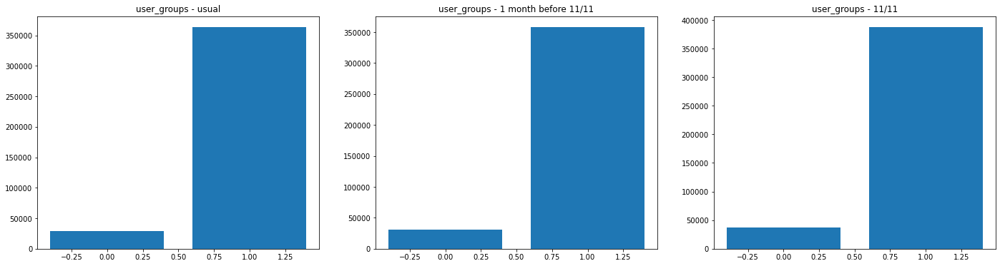

In [492]:
value_count_bar(by='user_groups')


### 2. 每人總行為次數分布
- x軸：期間總行動(click/favorite/cart/purchase)次數
- y軸：人數


===== usual =====


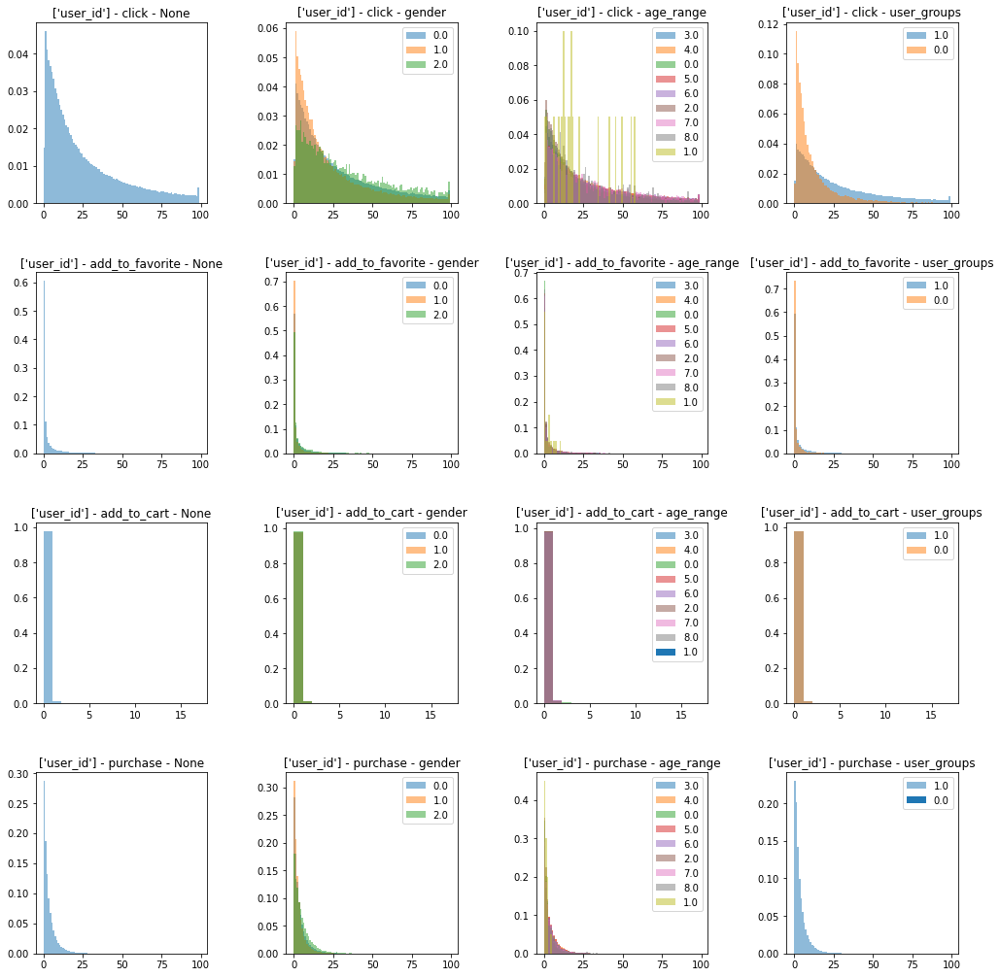

===== 1 month before 11/11 =====


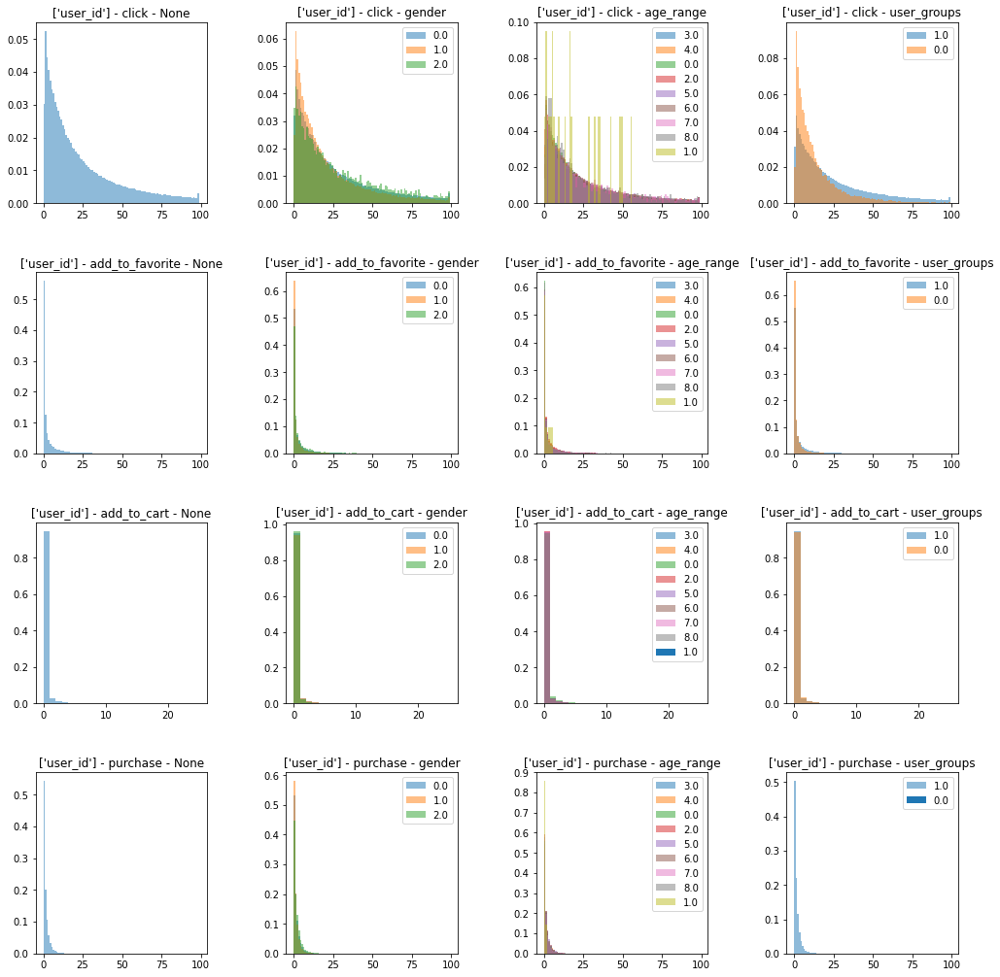

===== 11/11 =====


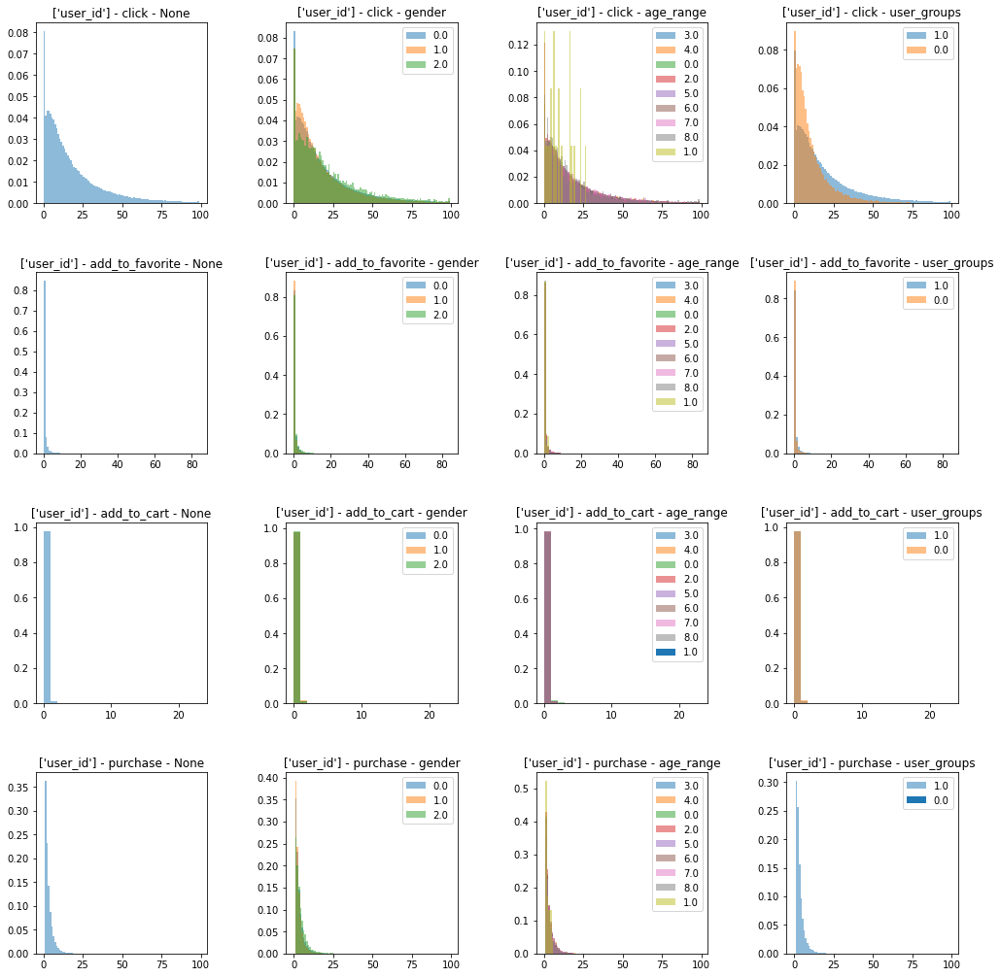

In [466]:
print('===== usual =====')
hist_subplot(df_usual, by=['user_id'], amount='event')
print('===== 1 month before 11/11 =====')
hist_subplot(df_event, by=['user_id'], amount='event')
print('===== 11/11 =====')
hist_subplot(df_1111, by=['user_id'], amount='event')


> 從圖表做出解讀與推測：（仍需與業務單位進行認知確認）

```
6-9月 & 雙11前一個月 (情況相似)
[click]
    1. gender
        - 2.0 的組中，每位用戶的點擊數平均較高、也較分散，不像 1.0 的組別，有較多人是集中在低點擊數的區域(左)
    2. user_groups
        - 1.0 (repeat buyers) 的組中，每位用戶的點擊數平均較高、較分散，不像只購買一次的用戶，有較多人是集中在低點擊數的區域(左)

[add_to_favorite]
    - 各組大部分用戶加入願望清單的次數集中於10-15次，僅有極少數用戶加入願望清單超過百次

[add_to_cart]
    - 各組大部分用戶加入購物車的次數集中於0-2次
    
[purchase]
    1. gender
        - 同 click 的分布差異；2.0 的組中，每位用戶的購買數平均較高、較分散，不像 1.0 的組別，有較多人是集中在低購買數的區域(左)
    2. user_groups
        - 總期間內只購買一次的用戶，從 6/1 - 11/10 都未有購買紀錄
        
```

### 3. (1) 點擊：每人不重複商品行為分布
- x軸：對幾種商品/品類/品牌/商家 點擊過的次數
- y軸：人數


===== usual =====


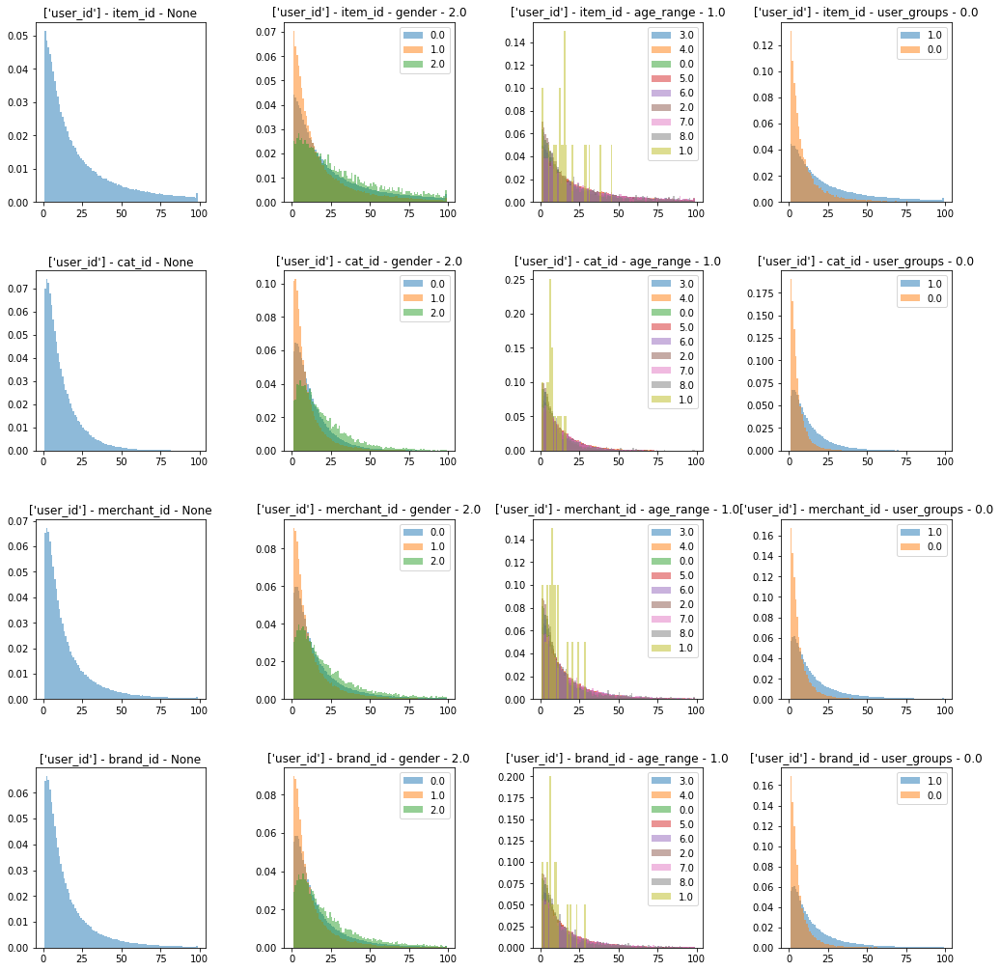

===== 1 month before 11/11 =====


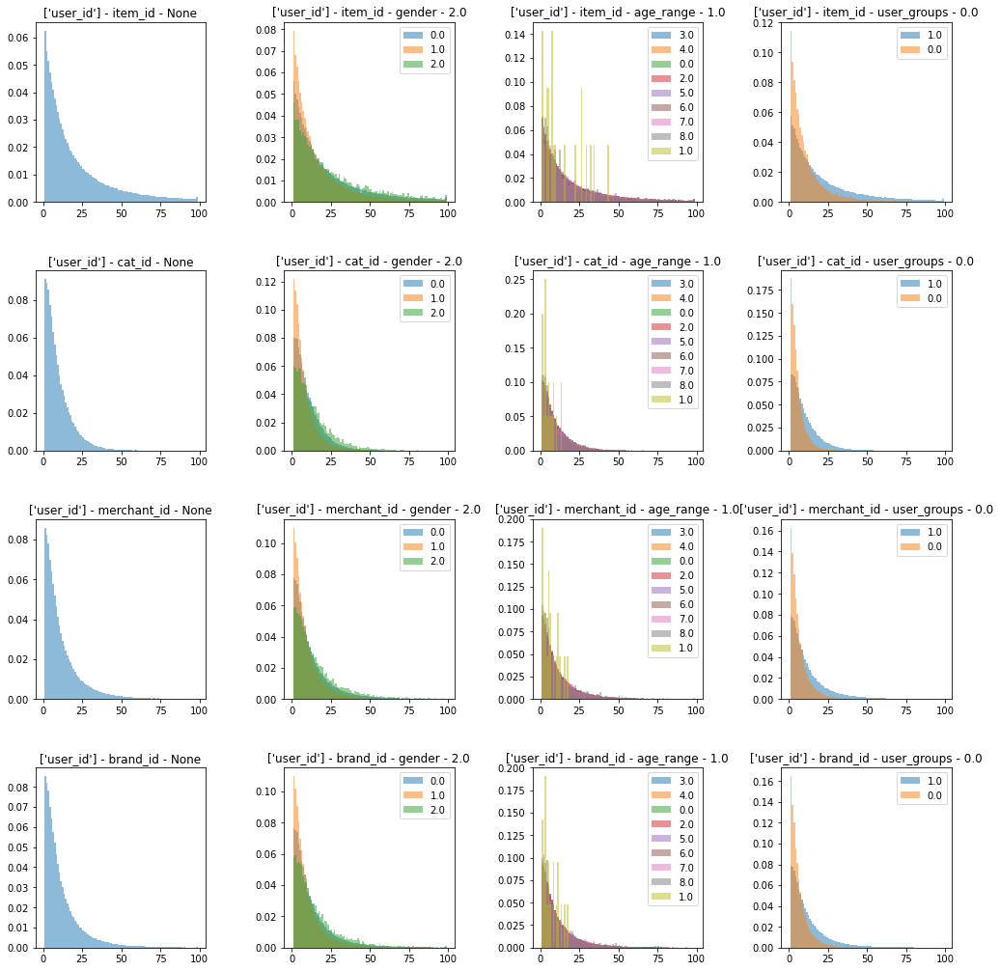

===== 11/11 =====


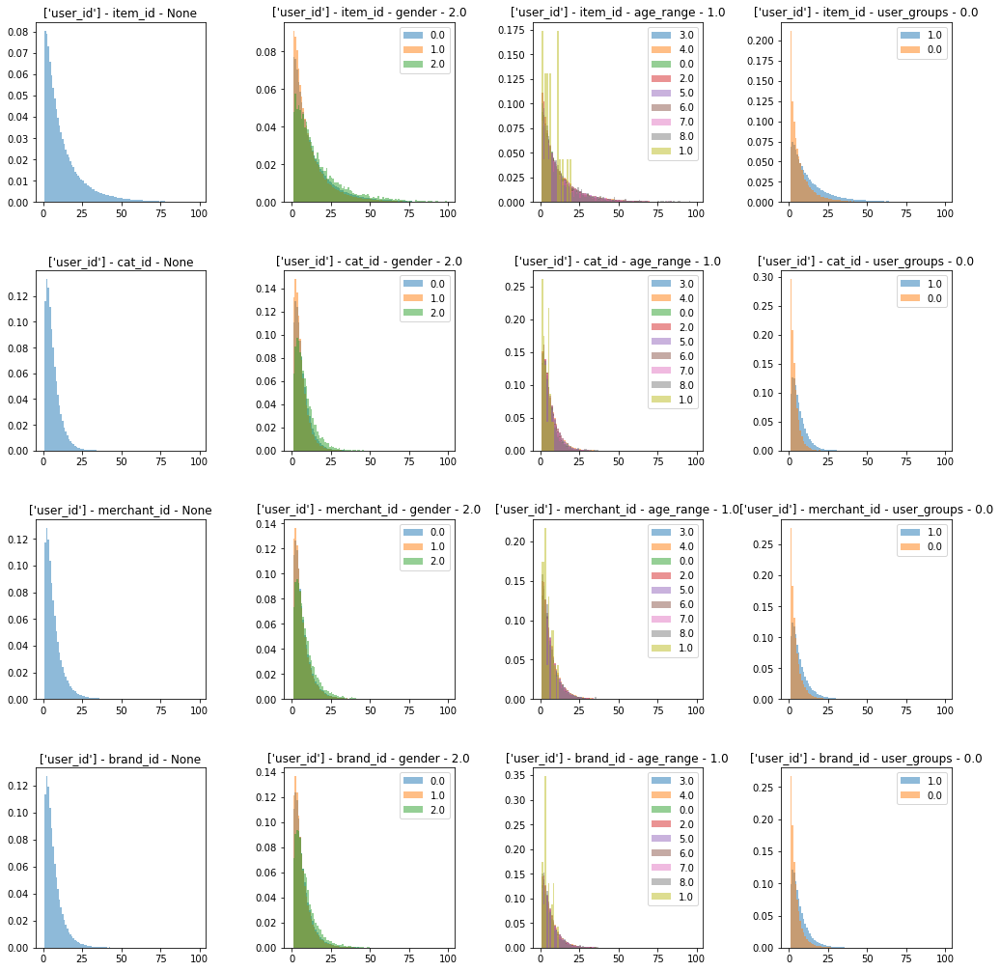

In [431]:
print('===== usual =====')
hist_subplot(df_usual, by=['user_id'], amount='product')
print('===== 1 month before 11/11 =====')
hist_subplot(df_event, by=['user_id'], amount='product')
print('===== 11/11 =====')
hist_subplot(df_1111, by=['user_id'], amount='product')


> 從圖表做出解讀與推測：（仍需與業務單位進行認知確認）

```
(與算所有點擊時的情況相似)

```

### 3. (2) 加入願望清單：每人不重複商品行為分布
- x軸：對幾種商品/品類/品牌/商家 加入過願望清單的次數
- y軸：人數


===== usual =====


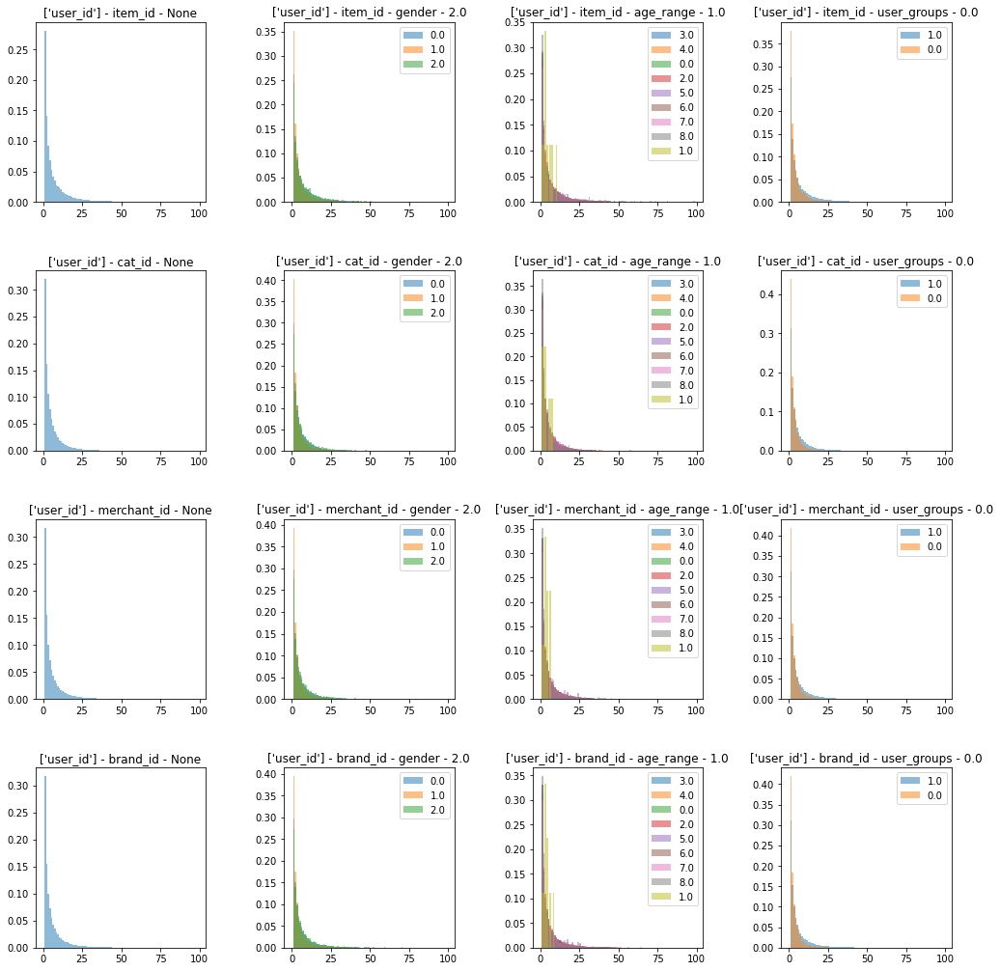

===== 1 month before 11/11 =====


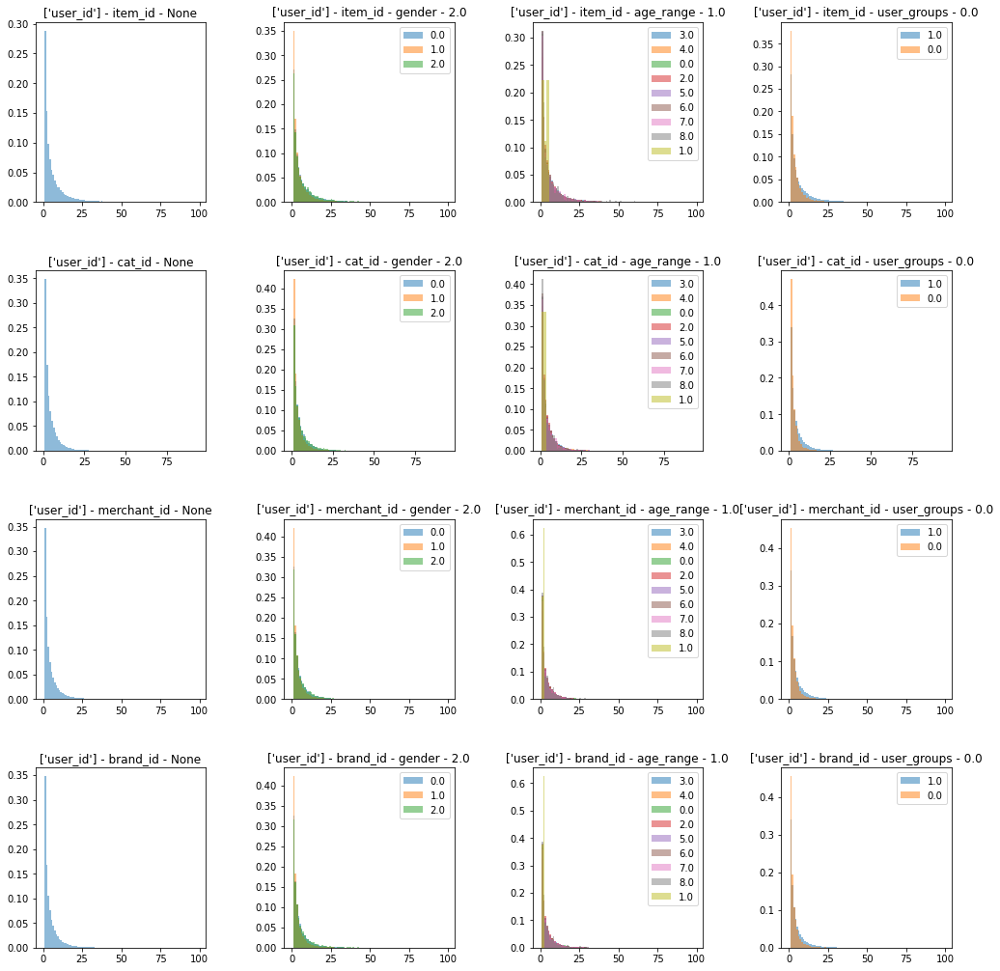

===== 11/11 =====


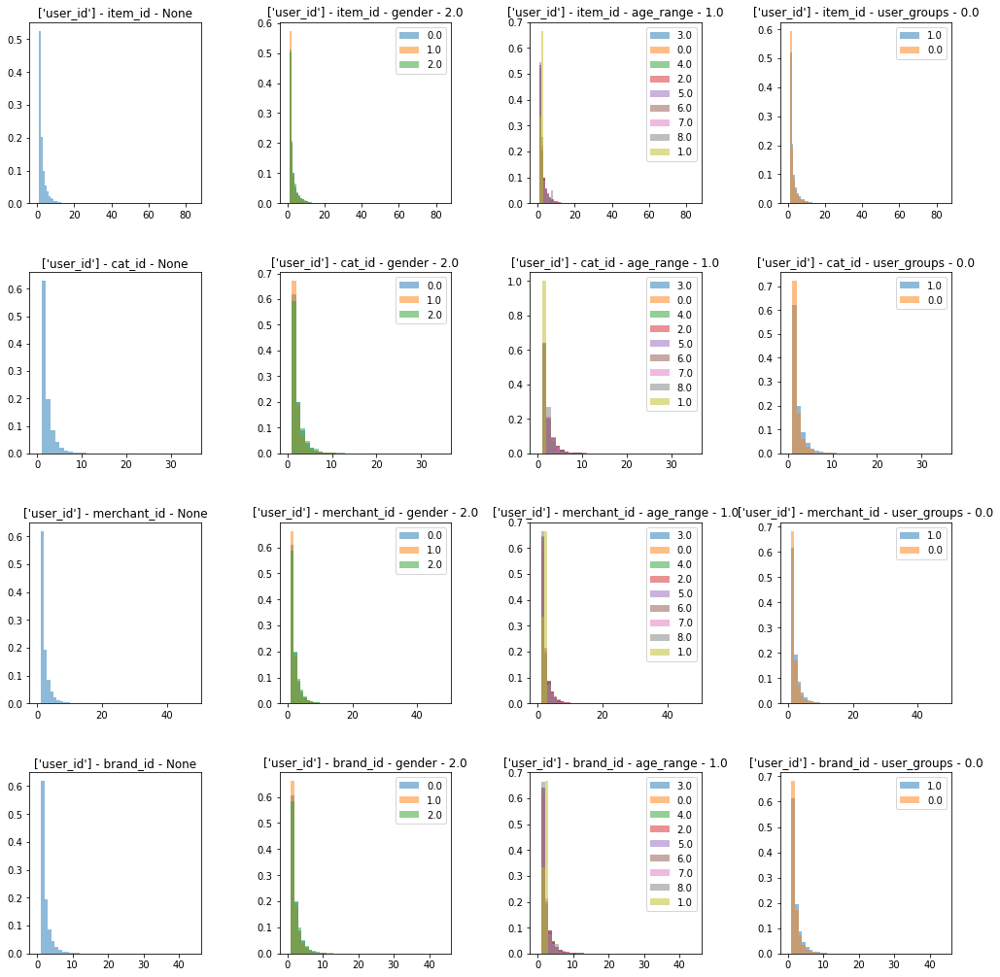

In [432]:
print('===== usual =====')
hist_subplot(df_usual[df_usual['add_to_favorite']>0], by=['user_id'], amount='product')
print('===== 1 month before 11/11 =====')
hist_subplot(df_event[df_event['add_to_favorite']>0], by=['user_id'], amount='product')
print('===== 11/11 =====')
hist_subplot(df_1111[df_1111['add_to_favorite']>0], by=['user_id'], amount='product')



> 從圖表做出解讀與推測：（仍需與業務單位進行認知確認）

```
(與算所有點擊時的情況相似)
```

### 3. (3) 加入購物車：每人不重複商品行為分布
- x軸：對幾種商品/品類/品牌/商家 加入購物車的次數
- y軸：人數


===== usual =====


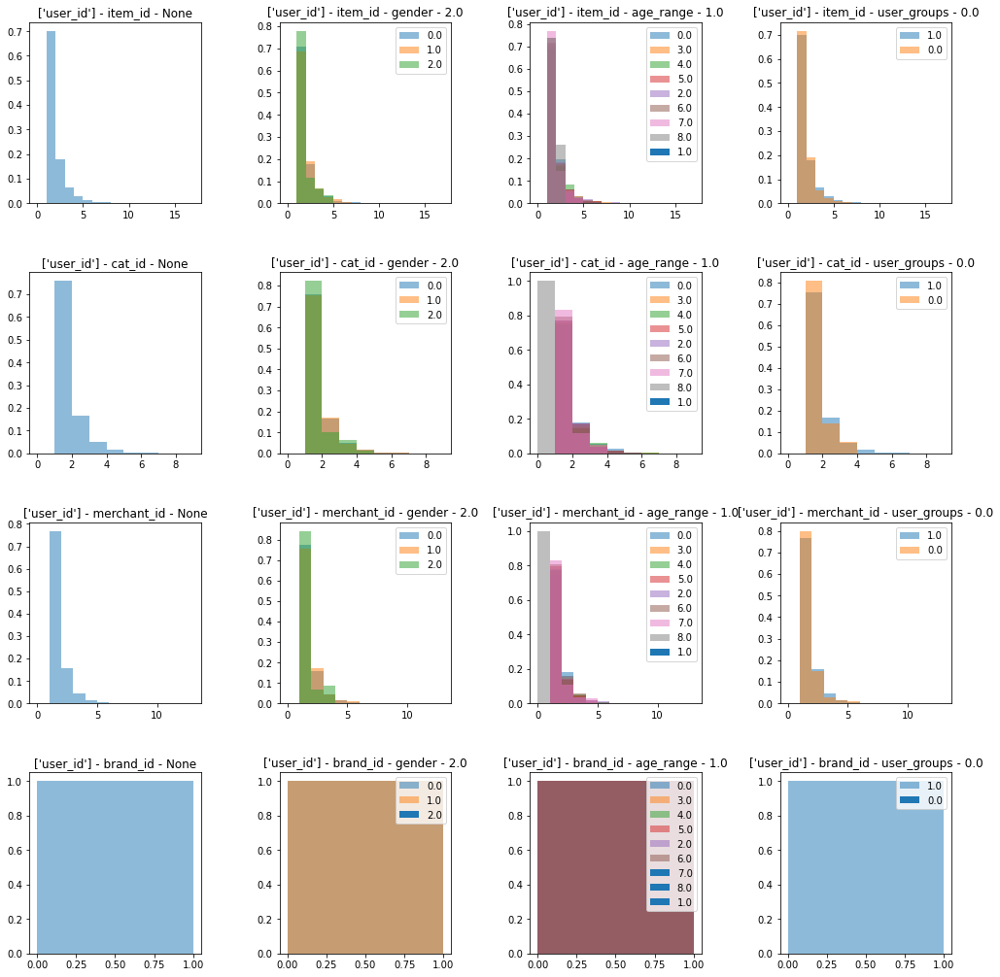

===== 1 month before 11/11 =====


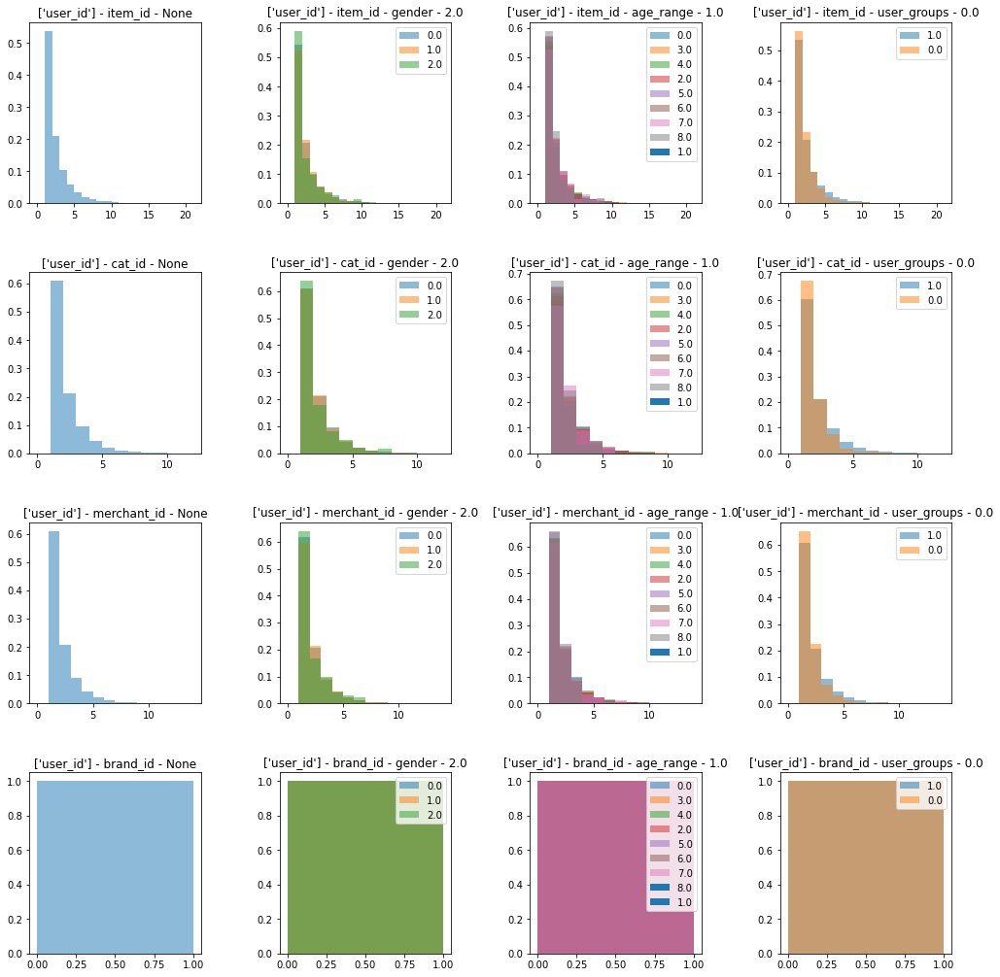

===== 11/11 =====


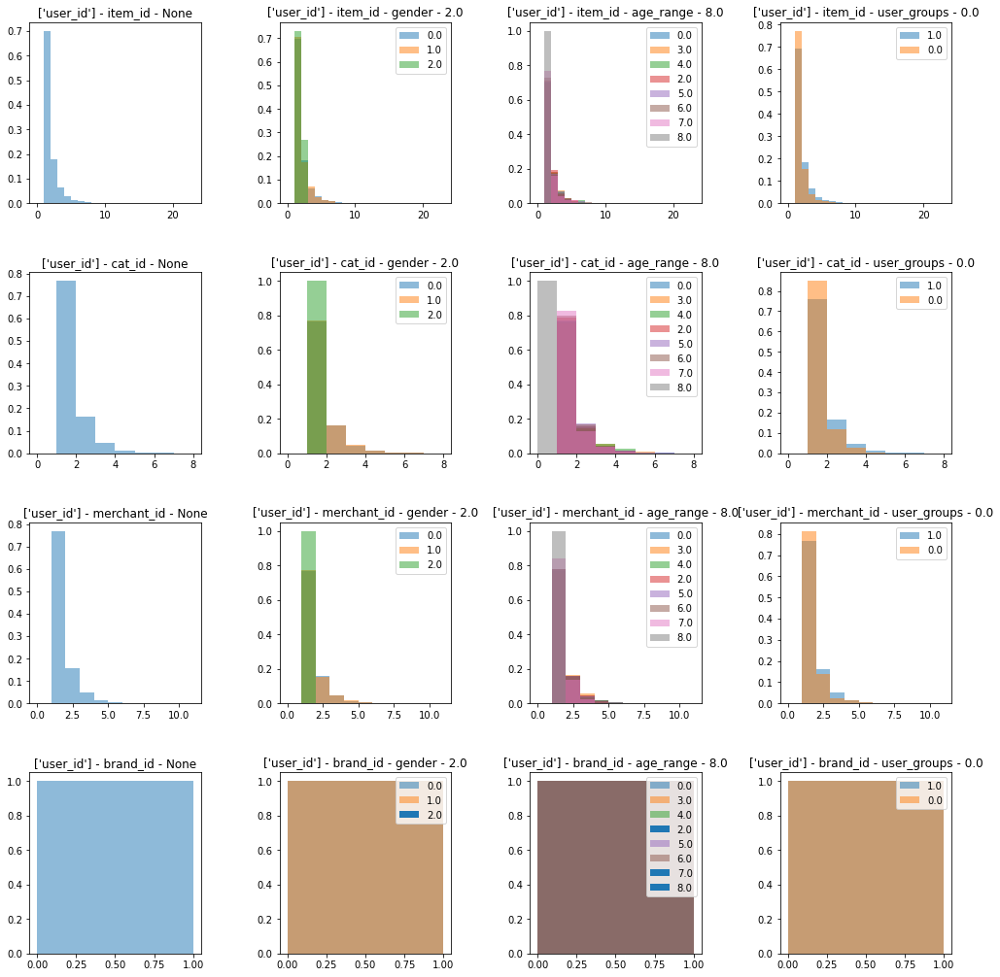

In [433]:
print('===== usual =====')
hist_subplot(df_usual[df_usual['add_to_cart']>0], by=['user_id'], amount='product')
print('===== 1 month before 11/11 =====')
hist_subplot(df_event[df_event['add_to_cart']>0], by=['user_id'], amount='product')
print('===== 11/11 =====')
hist_subplot(df_1111[df_1111['add_to_cart']>0], by=['user_id'], amount='product')


> 從圖表做出解讀與推測：（仍需與業務單位進行認知確認）

```
P.S. add_to_cart 事件只佔0.1%，恰巧有記錄到 brand_id 的紀錄非常少（在一開始有缺值，大部分都被補為 'unknown'）
```

### 3. (4) 購買：每人不重複商品行為分布
- x軸：對幾種商品/品類/品牌/商家 購買過的次數
- y軸：人數




===== usual =====


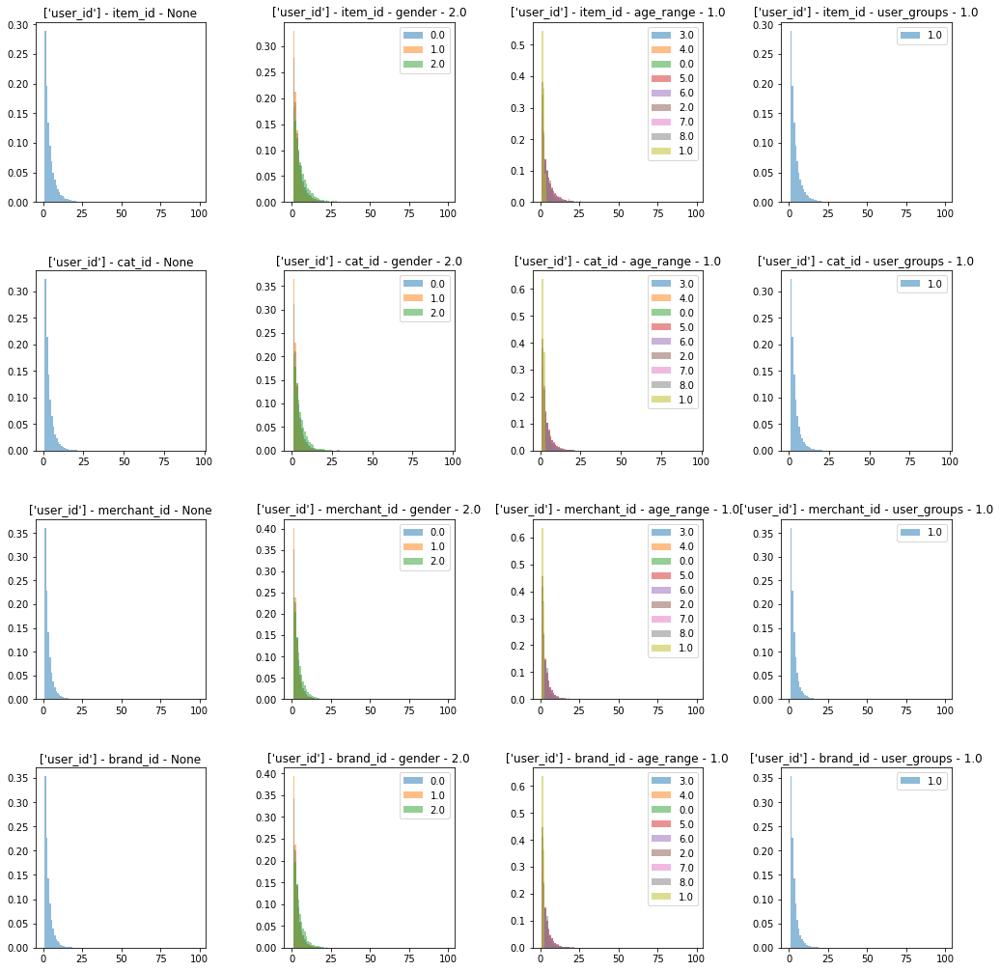

===== 1 month before 11/11 =====


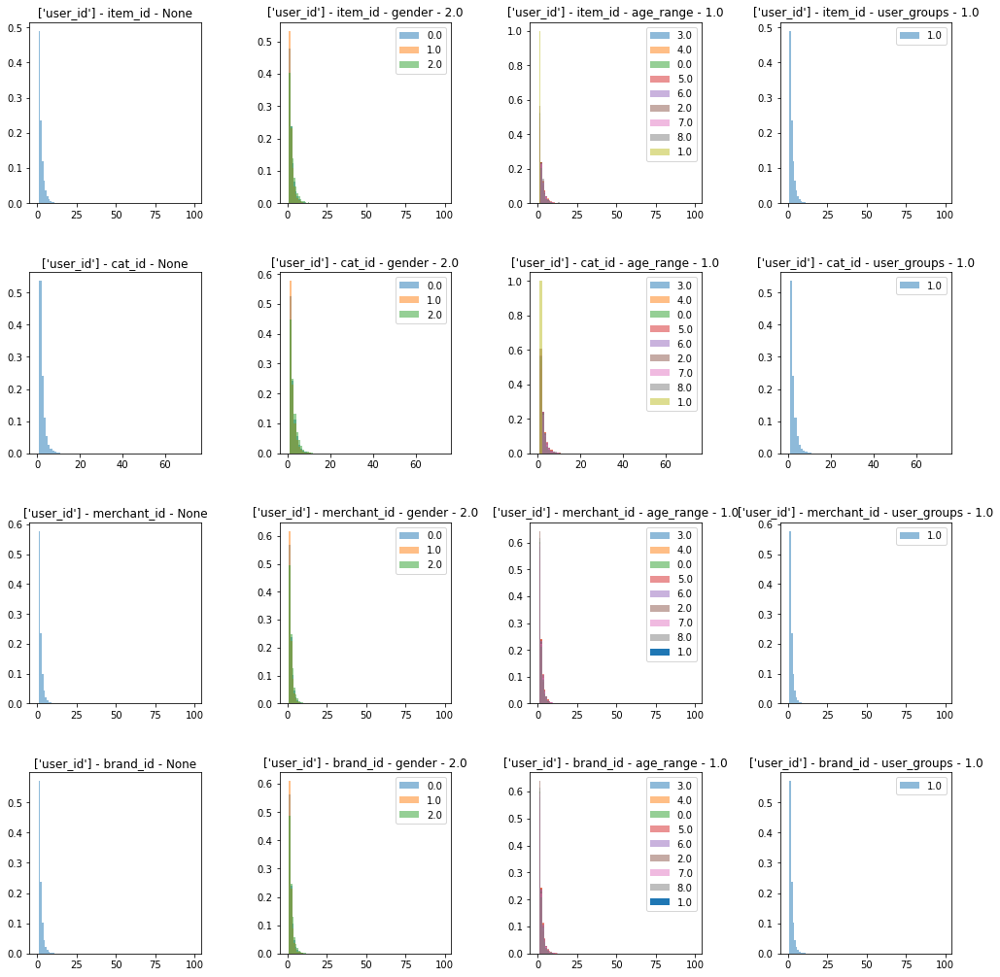

===== 11/11 =====


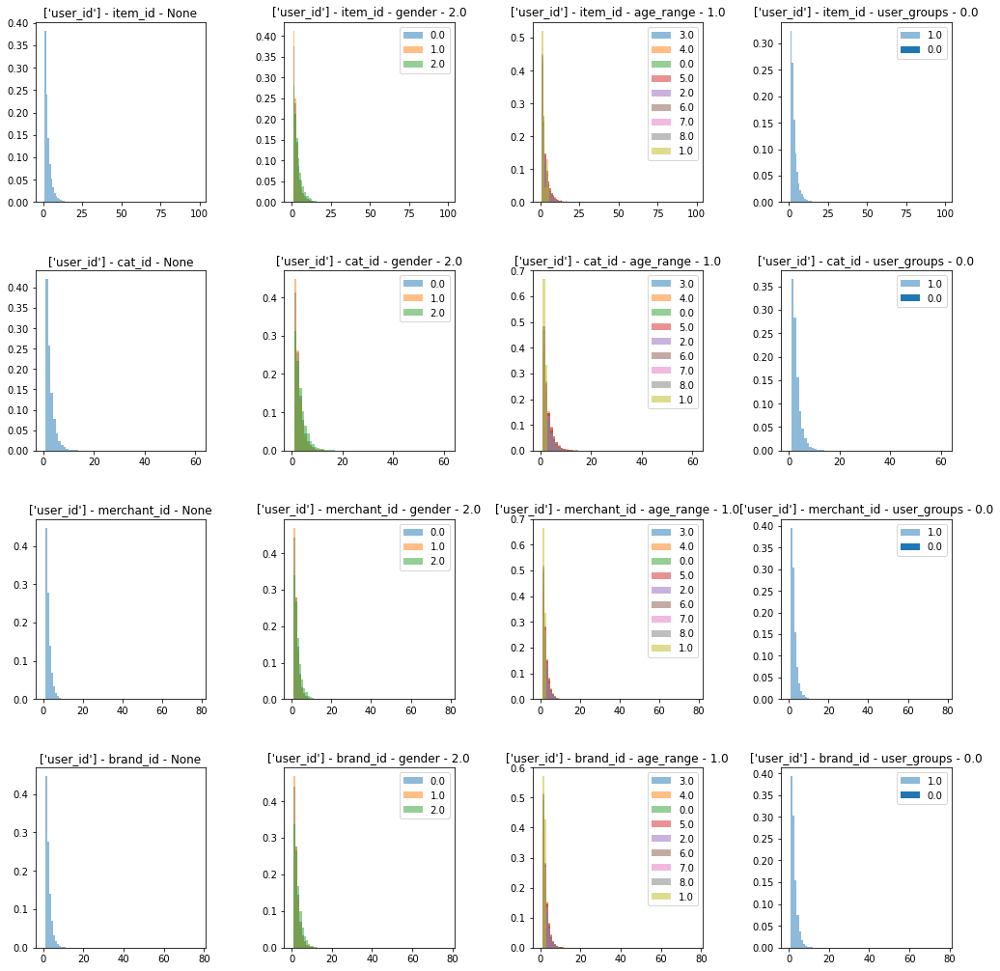

In [434]:
print('===== usual =====')
hist_subplot(df_usual[df_usual['purchase']>0], by=['user_id'], amount='product')
print('===== 1 month before 11/11 =====')
hist_subplot(df_event[df_event['purchase']>0], by=['user_id'], amount='product')
print('===== 11/11 =====')
hist_subplot(df_1111[df_1111['purchase']>0], by=['user_id'], amount='product')


> 從圖表做出解讀與推測：（仍需與業務單位進行認知確認）

```
(與算所有點擊時的情況相似)
```

### 4. (1) 點擊：每人不重複入站時間數分布
- x軸：入站點擊的不重複天/周/月數
- y軸：人數


===== usual =====


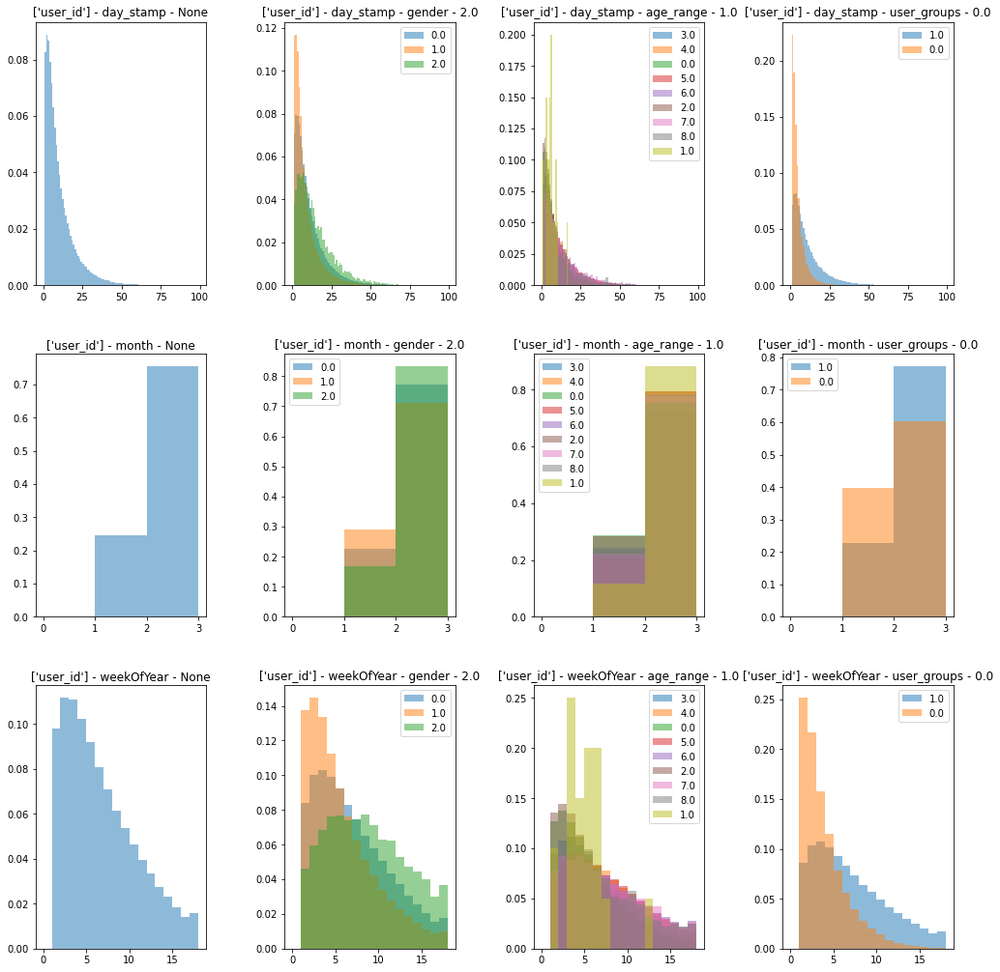

===== 1 month before 11/11 =====


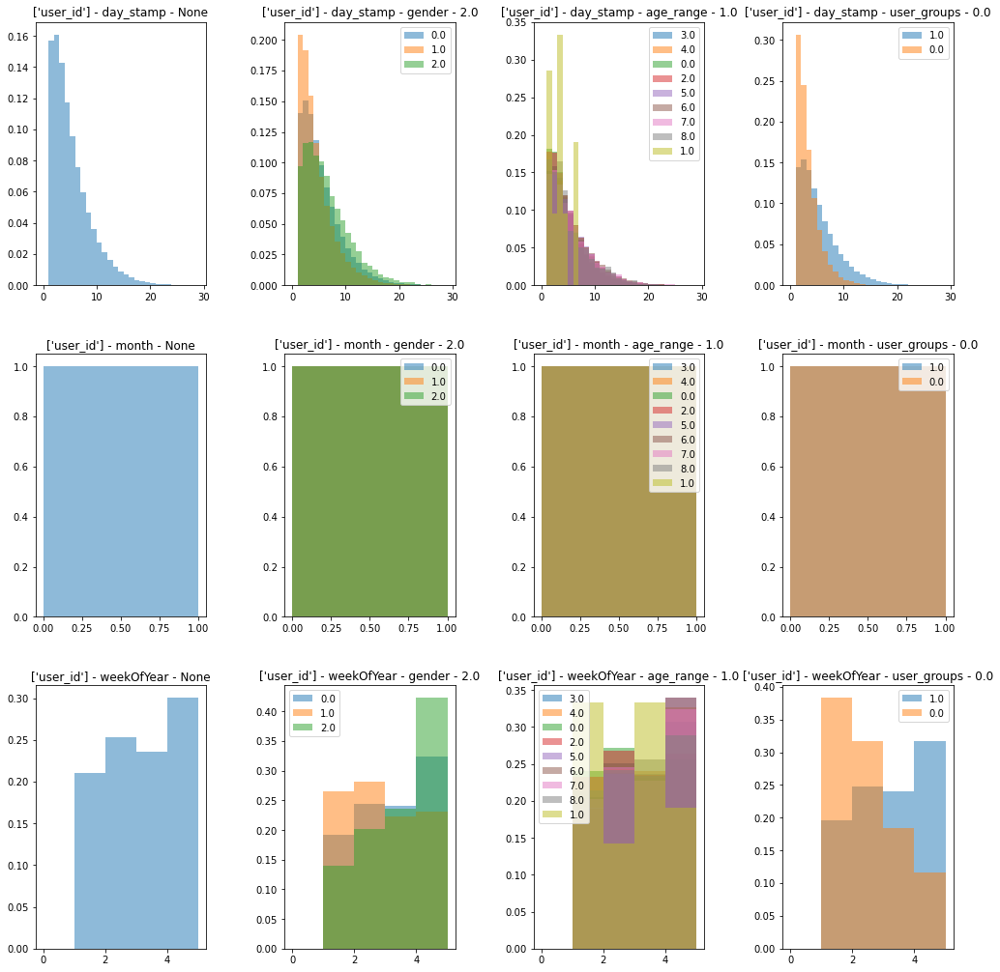

In [435]:
print('===== usual =====')
hist_subplot(df_usual, by=['user_id'], amount='time')
print('===== 1 month before 11/11 =====')
hist_subplot(df_event, by=['user_id'], amount='time')


> 從圖表做出解讀與推測：

```
[weekOfYear] 週數
1. gender
    - 2.0 組的有4成以上用戶，雙11前一個月，每周都有入站紀錄；比 1.0 組高出約2倍
2. user_groups
    - 回購者的有3成以上用戶，雙11前一個月，每周都有入站紀錄；而單次購買者有7成僅2周進站

```

### 4. (2) 加入願望清單：每人不重複入站時間數分布
- x軸：入站有加入願望清單的不重複天/周/月數
- y軸：人數


===== usual =====


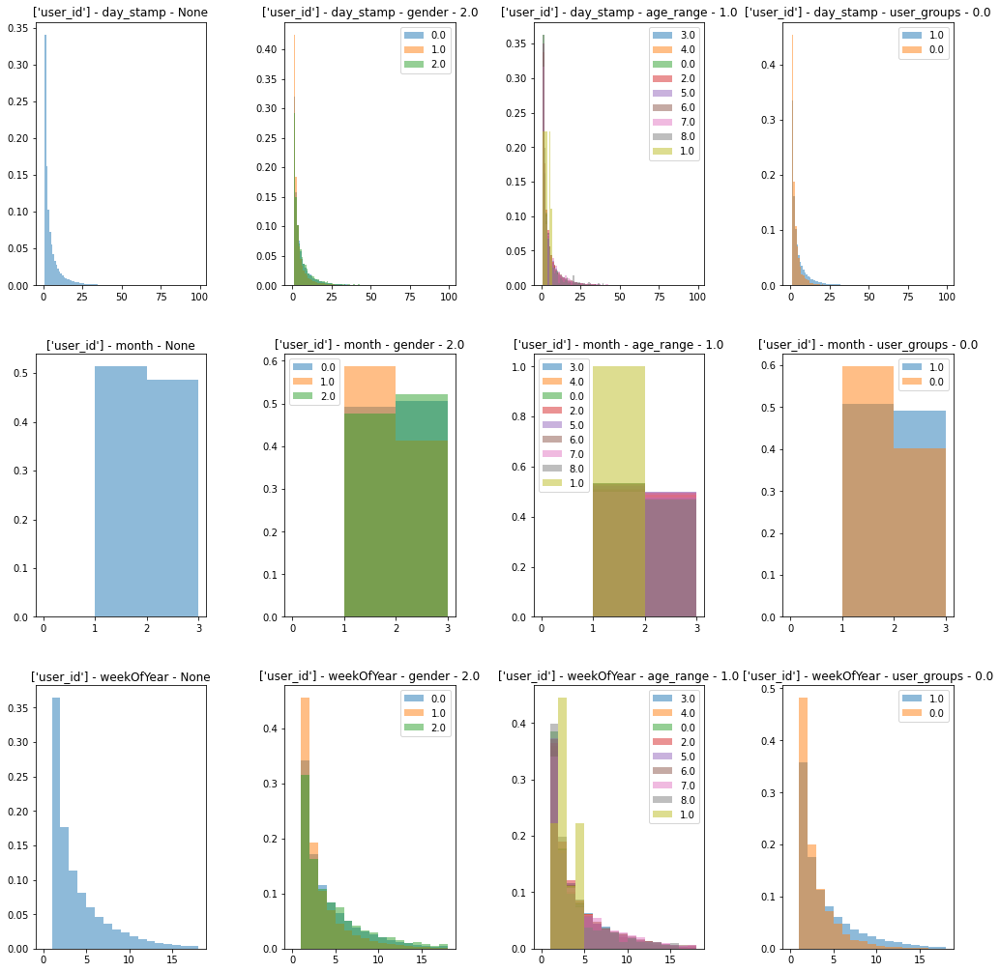

===== 1 month before 11/11 =====


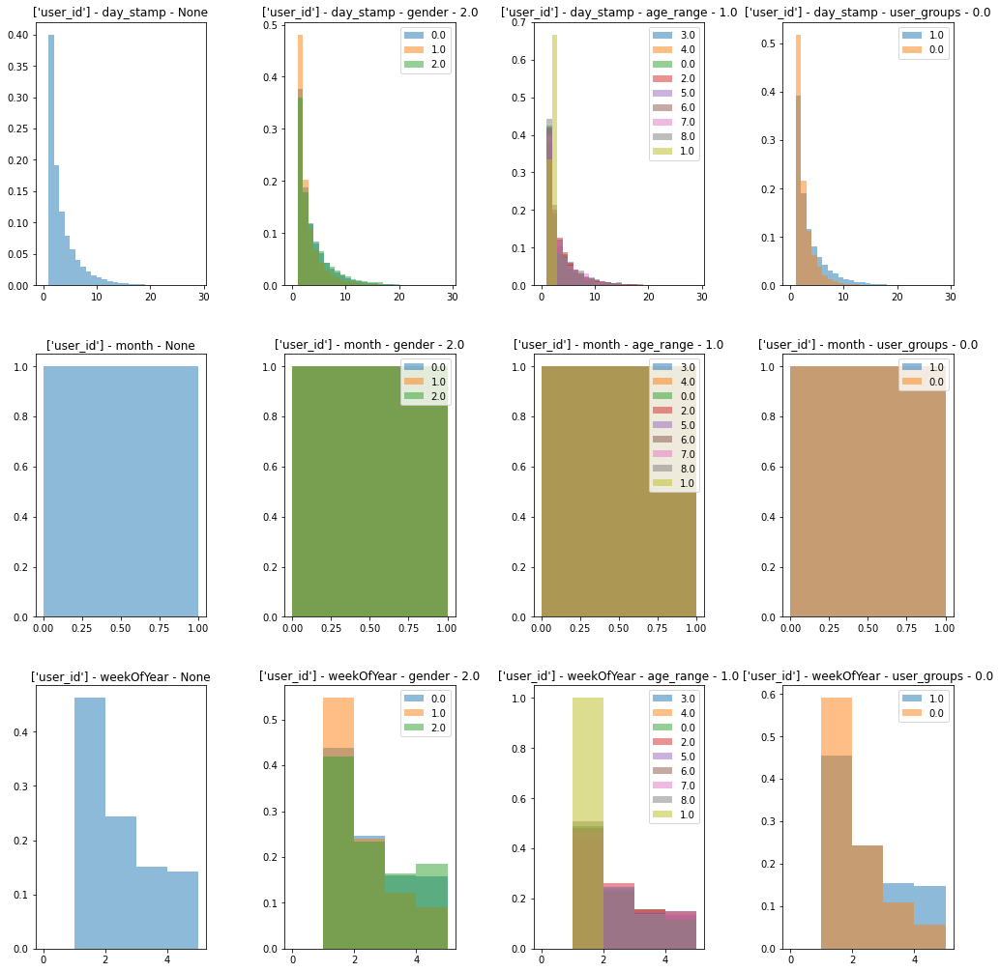

In [436]:
print('===== usual =====')
hist_subplot(df_usual[df_usual['add_to_favorite']>0], by=['user_id'], amount='time')
print('===== 1 month before 11/11 =====')
hist_subplot(df_event[df_event['add_to_favorite']>0], by=['user_id'], amount='time')


> 從圖表做出解讀與推測：（仍需與業務單位進行認知確認）

```
(與算所有點擊時的情況相似)

```

### 4. (3) 加入購物車：每人不重複入站時間數分布
- x軸：入站有加入購物車的不重複天/周/月數
- y軸：人數



===== usual =====


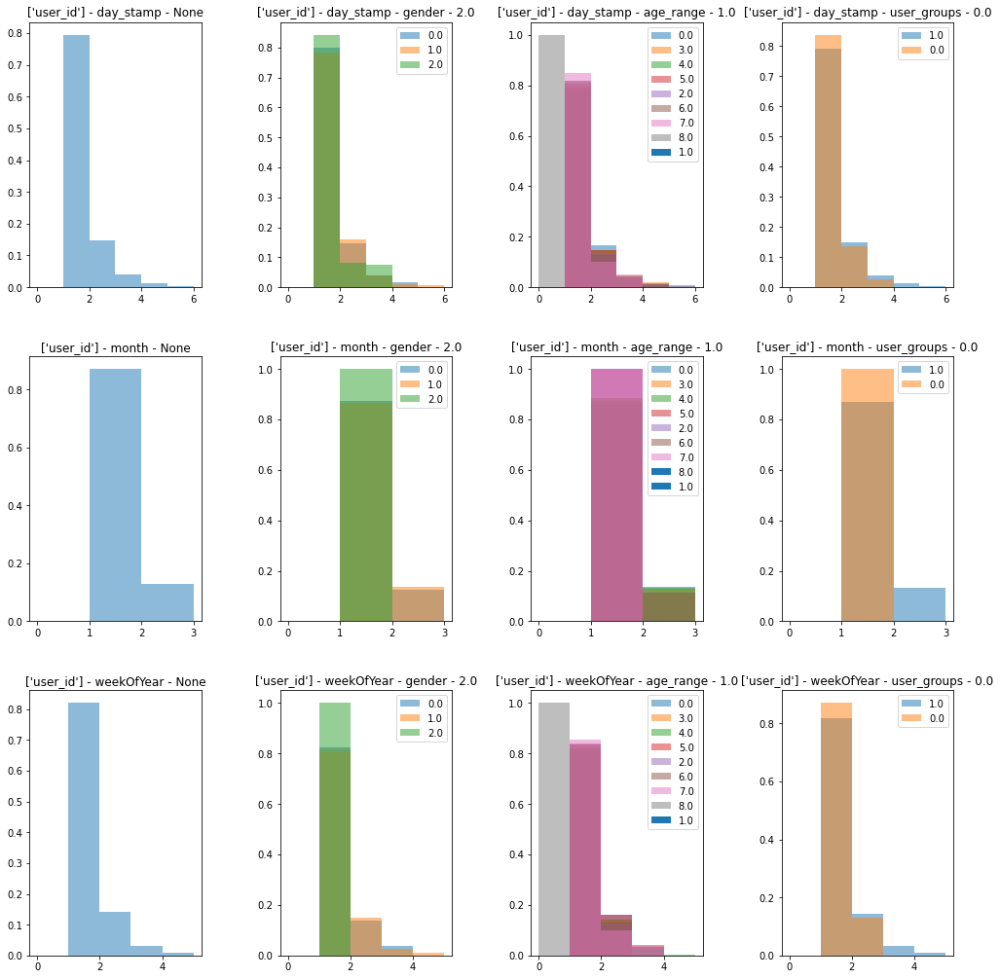

===== 1 month before 11/11 =====


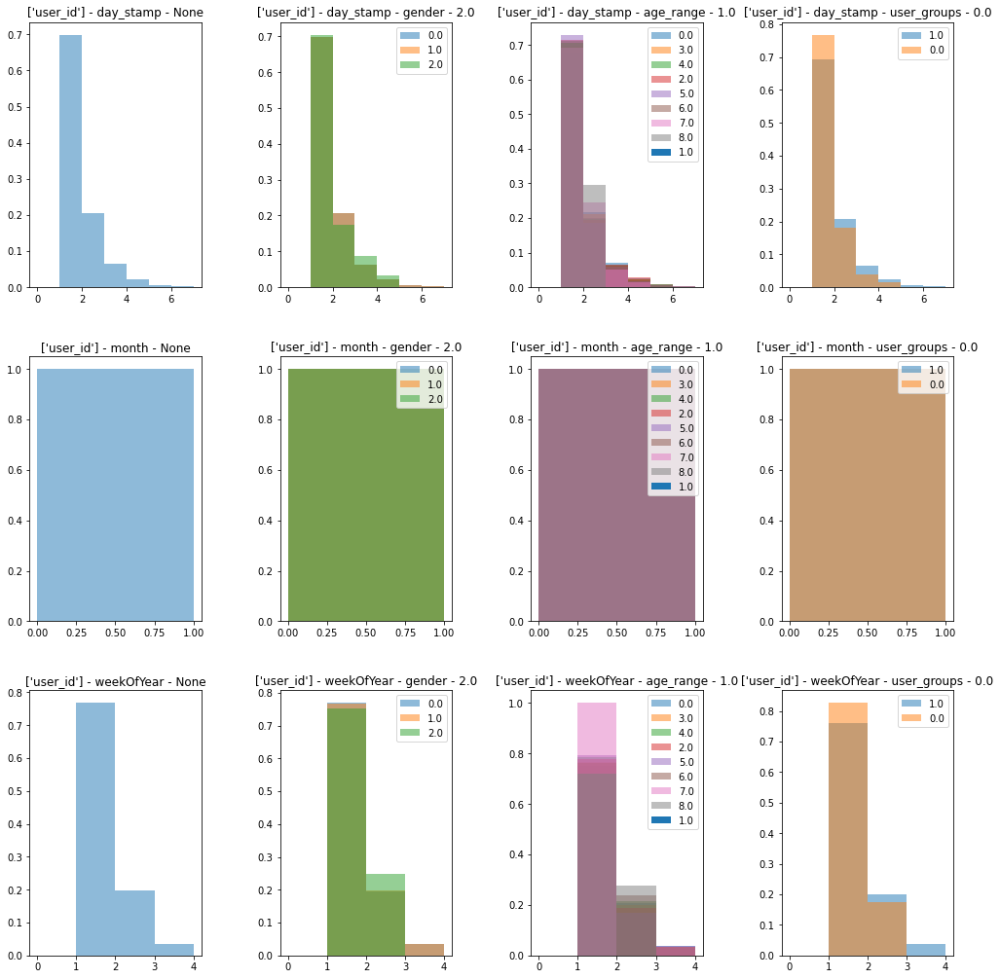

In [437]:
print('===== usual =====')
hist_subplot(df_usual[df_usual['add_to_cart']>0], by=['user_id'], amount='time')
print('===== 1 month before 11/11 =====')
hist_subplot(df_event[df_event['add_to_cart']>0], by=['user_id'], amount='time')


> 從圖表做出解讀與推測：（仍需與業務單位進行認知確認）

```
P.S. add_to_cart 事件只佔0.1%，量體較少，不


> 從圖表做出解讀與推測：（仍需與業務單位進行認知確認）

```
(與算所有點擊時的情況相似)

```

### 4. (4) 購買：每人不重複入站時間數分布
- x軸：入站有購買的不重複天/周/月數
- y軸：人數



===== usual =====


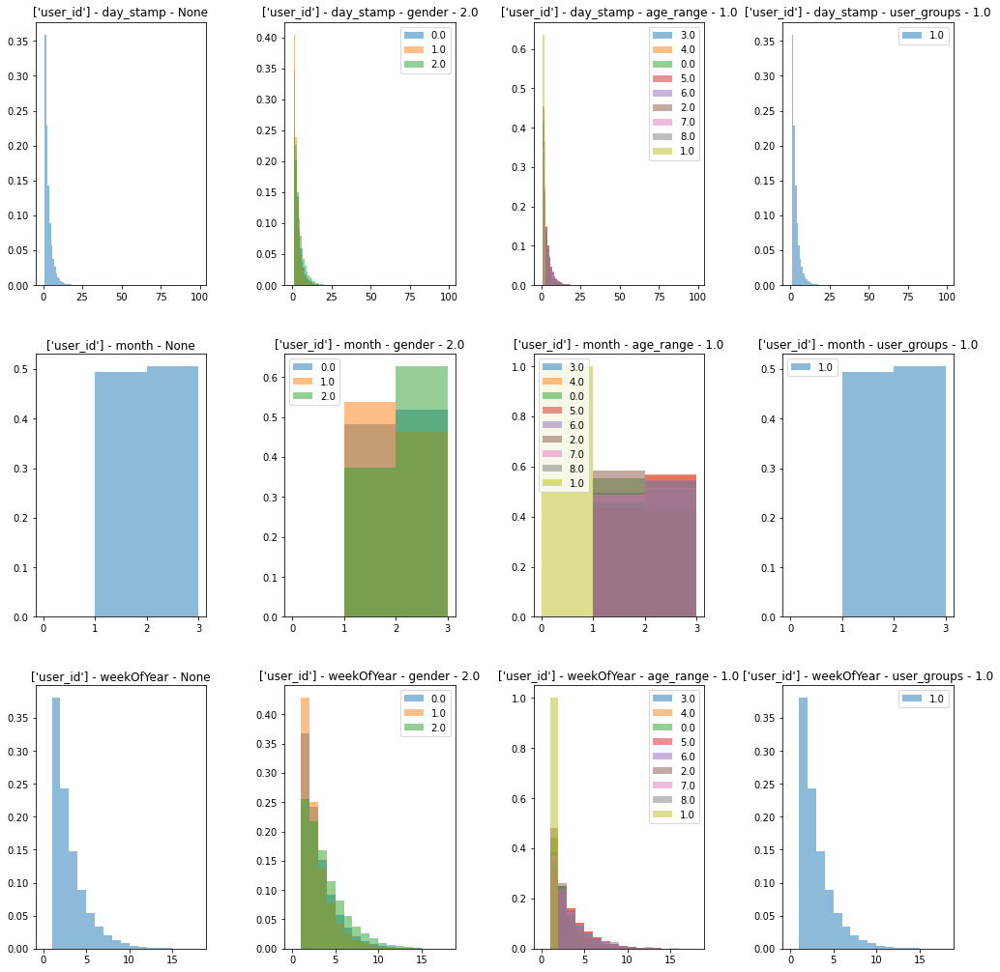

===== 1 month before 11/11 =====


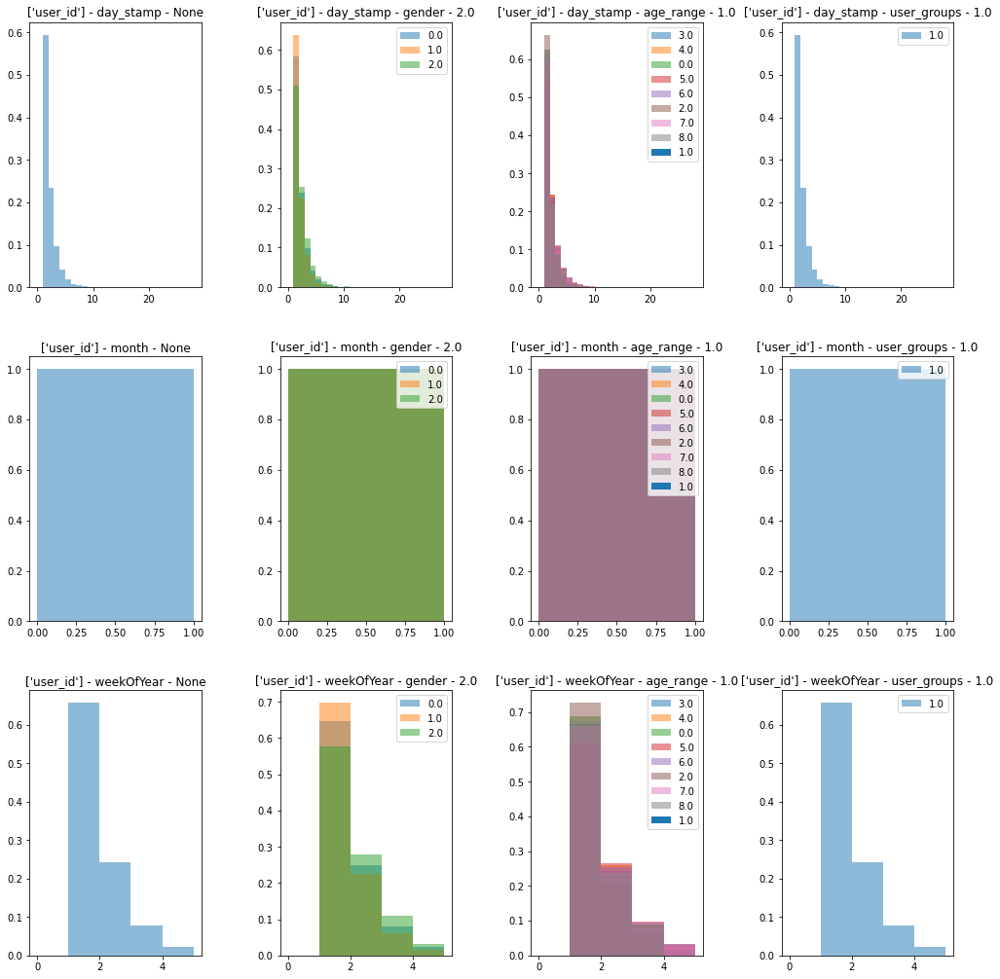

In [438]:
print('===== usual =====')
hist_subplot(df_usual[df_usual['purchase']>0], by=['user_id'], amount='time')
print('===== 1 month before 11/11 =====')
hist_subplot(df_event[df_event['purchase']>0], by=['user_id'], amount='time')


> 從圖表做出解讀與推測：

```
[weekOfYear] 週數
1. gender
    - 統整前面對點擊的觀察，2.0 組在購買紀錄則是只集中1-2次；推測 2.0 組可能較傾向提前入站點擊瀏覽，但依然是最後一周才決定購買
2. user_groups
    - 單次購買者 6/1 - 11/10 都未有購買紀錄

```

### 5. 隨時間變化趨勢圖 
*(次數以百分比呈現，方便比較；避免分組之間的用戶數量差異很大)
- (左) 6-9月／(右) 10/11-11/10 (雙11一個月前)
- 時間顆粒度：每日／每周／每月
    - 行為屬性
        - 分組
    

- 時間顆粒度：每日 (day_stamp)

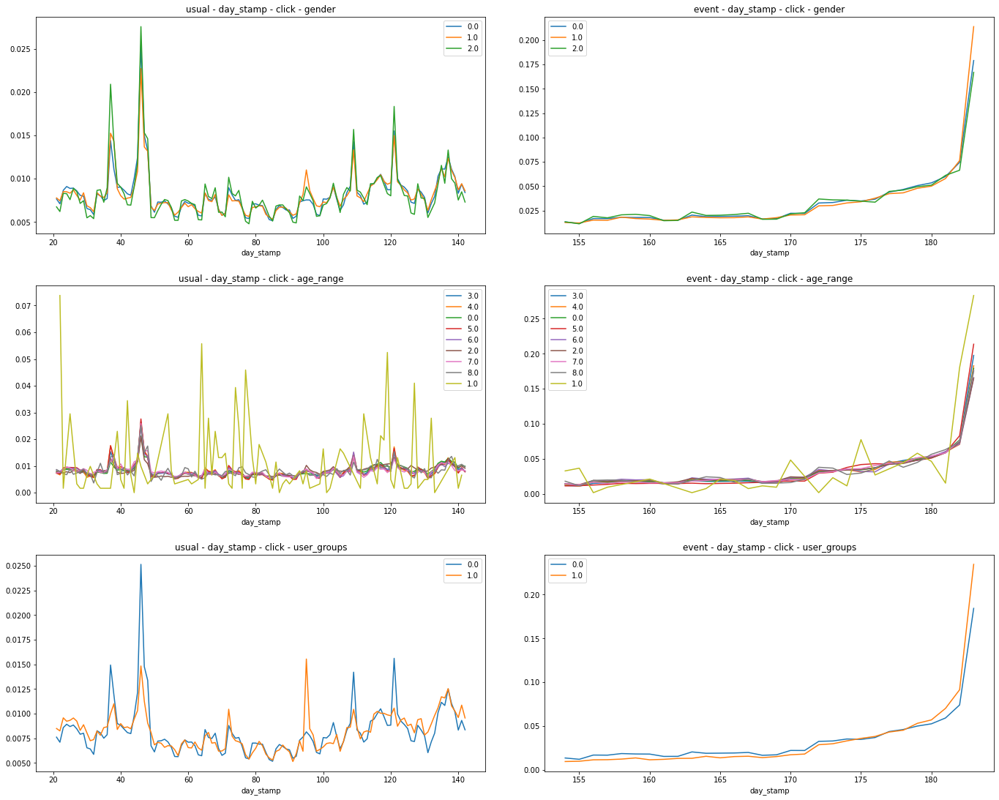

In [393]:
trend_lineplot(time_attr='day_stamp', amount='click')


> 從圖表做出解讀與推測：

```
[day_stamp] 每日線
從曲線的消長可看出 click 隨星期幾有一定規律；高峰點約落在 6月初、6月底可能有全站活動
雙11前10-15天左右，進站量開始上升；在5天前上升幅度增加

1. gender
    - 1.0 組在 8月初的進站量曾經達到三組最高，推測此活動特別吸引這個族群
    
2. user_groups
    - 單次購買者在 6月初、6月底活動時進站量高於回購者數倍，推測此活動吸引較多"非回購者"；這些高峰流量並未帶來訂單。
    - 而回購者在 8月初的進站量高於單次購買者數倍，推測此活動則吸引較多"回購者"
    
```

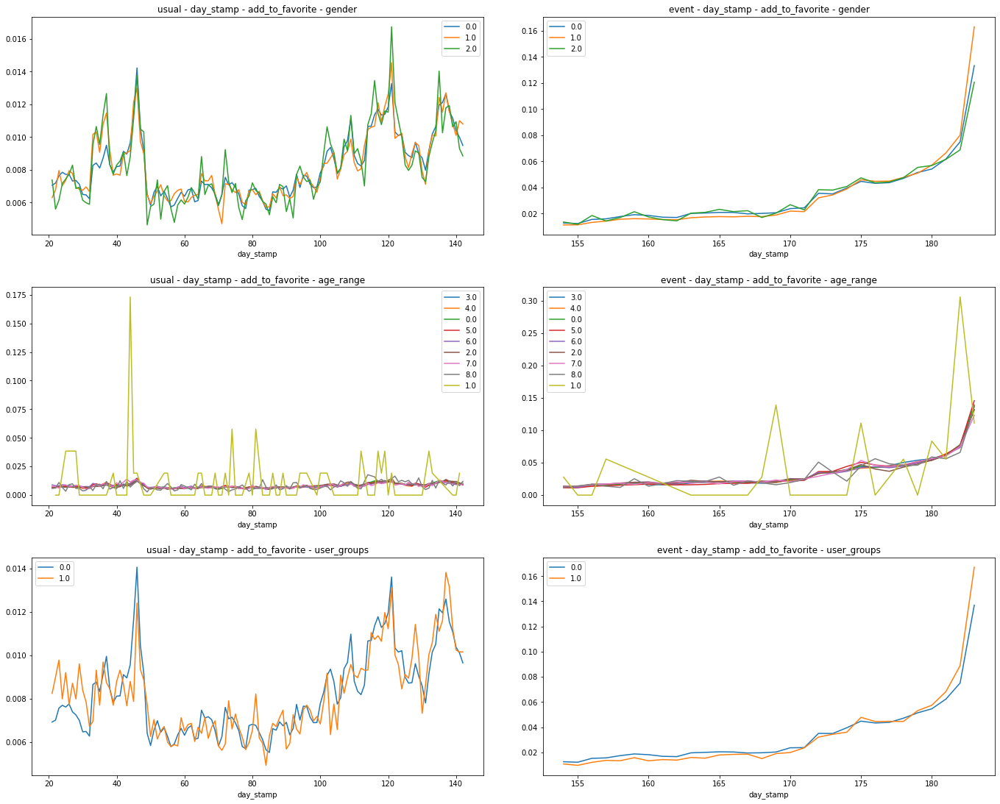

In [394]:
trend_lineplot(time_attr='day_stamp', amount='add_to_favorite')


> 從圖表做出解讀與推測：（仍需與業務單位進行認知確認）

```
(未有較為明顯的特徵)

```

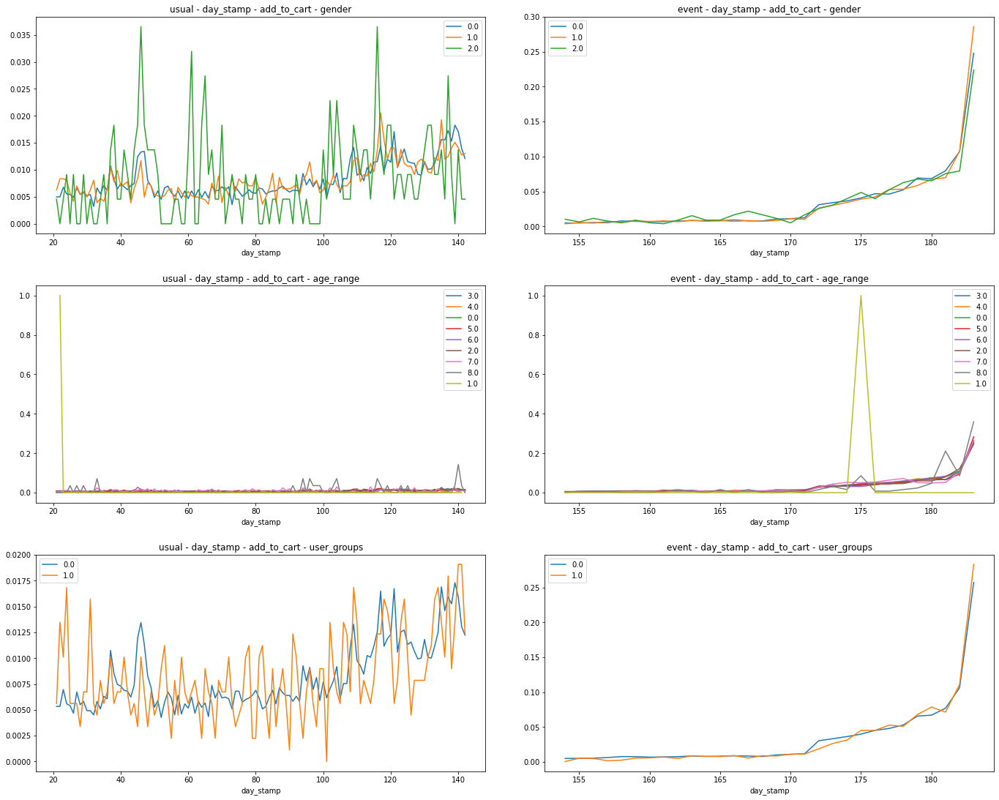

In [395]:
trend_lineplot(time_attr='day_stamp', amount='add_to_cart')


> 從圖表做出解讀與推測：（仍需與業務單位進行認知確認）

```
(未有較為明顯的特徵)

```

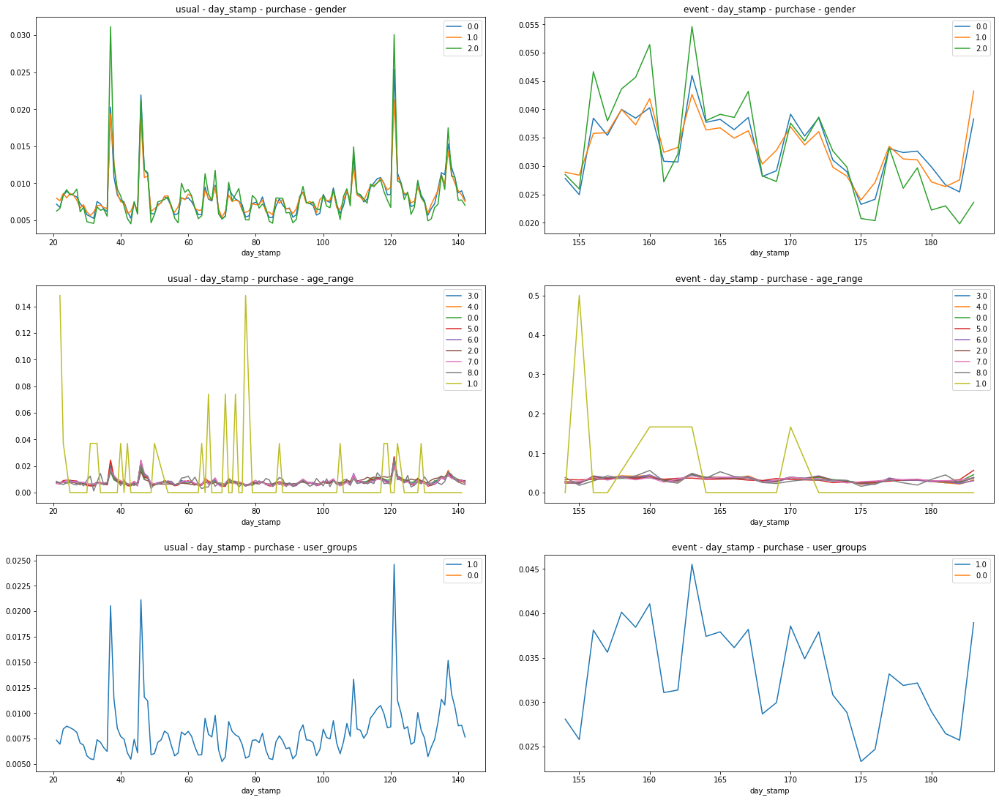

In [404]:
trend_lineplot(time_attr='day_stamp', amount='purchase')


> 從圖表做出解讀與推測：

```
[day_stamp] 每日線
在雙11前10-15天的購買量會先下降，直到前一天才回升、當天爆發

1. user_groups
    - 回購者在6月初、6月底、8月底的活動的購買量表現較佳
    
```

- 時間顆粒度：每周 (weekOfYear)

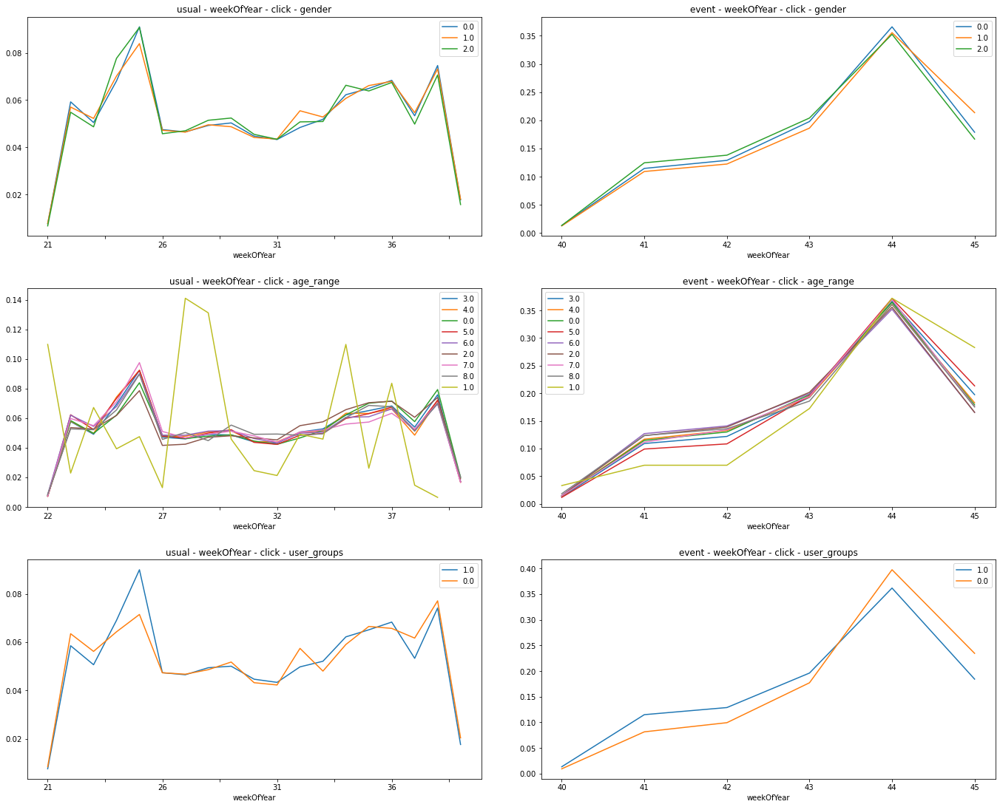

In [405]:
trend_lineplot(time_attr='weekOfYear', amount='click')


> 從圖表做出解讀與推測：（仍需與業務單位進行認知確認）

```
(未有較為明顯的特徵)

```

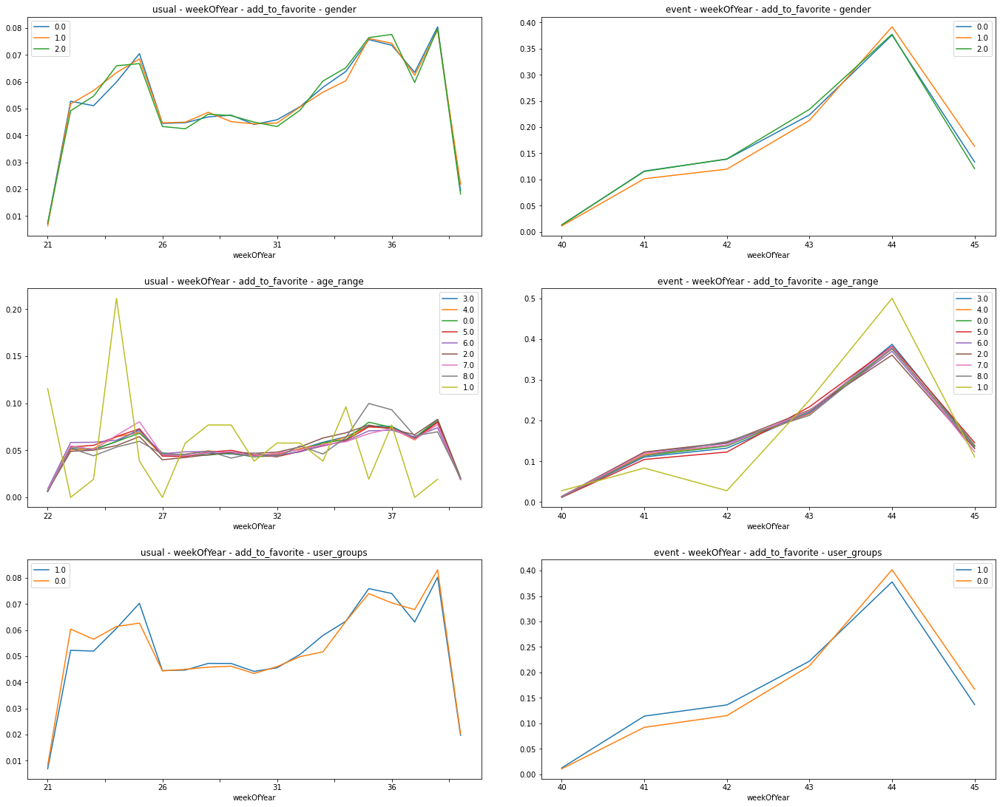

In [406]:
trend_lineplot(time_attr='weekOfYear', amount='add_to_favorite')


> 從圖表做出解讀與推測：（仍需與業務單位進行認知確認）

```
(未有較為明顯的特徵)

```

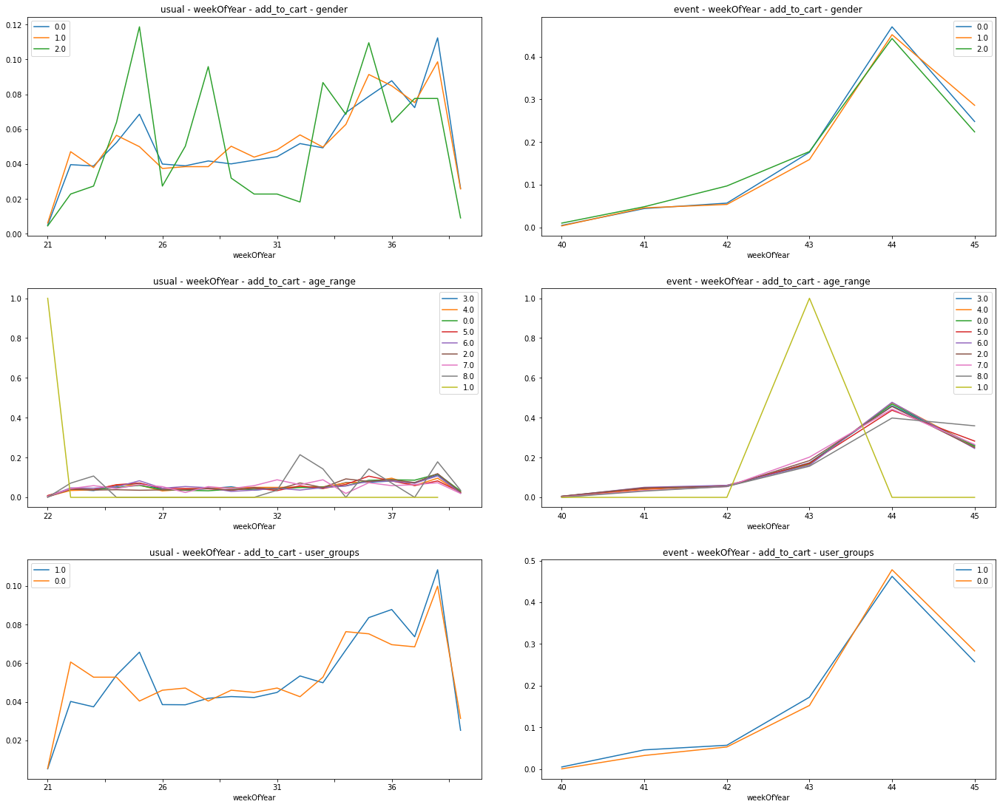

In [407]:
trend_lineplot(time_attr='weekOfYear', amount='add_to_cart')


> 從圖表做出解讀與推測：（仍需與業務單位進行認知確認）

```
(未有較為明顯的特徵)

```

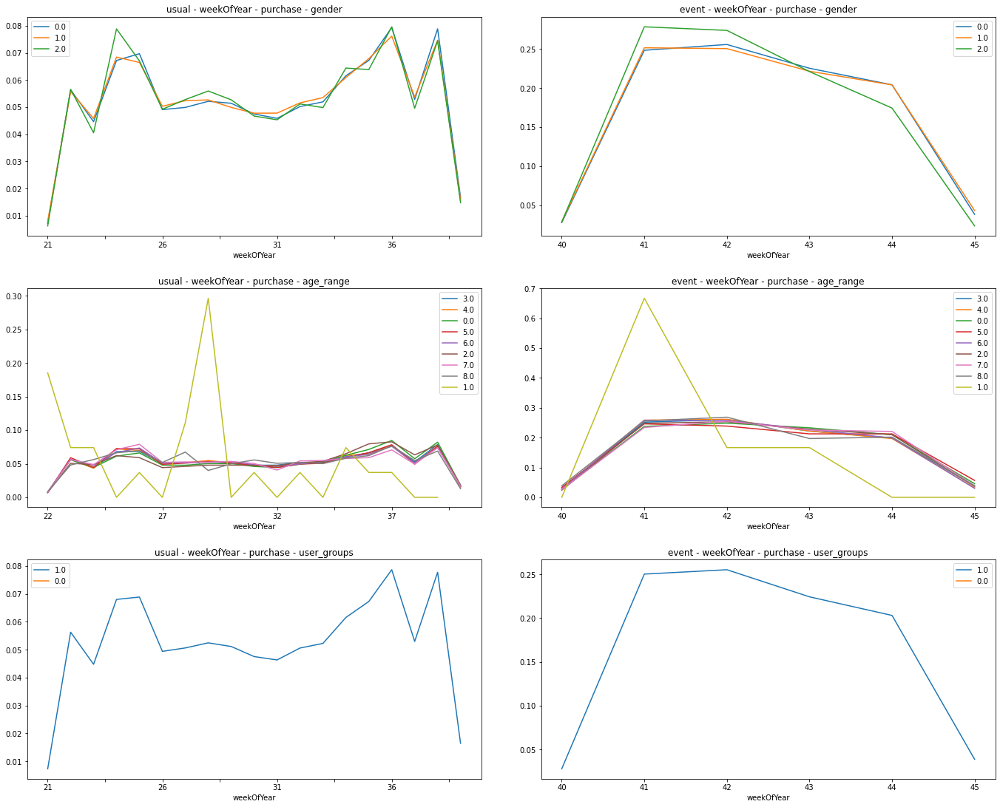

In [408]:
trend_lineplot(time_attr='weekOfYear', amount='purchase')


> 從圖表做出解讀與推測：（仍需與業務單位進行認知確認）

```
(未有較為明顯的特徵)

```

- 時間顆粒度：每月 (month)

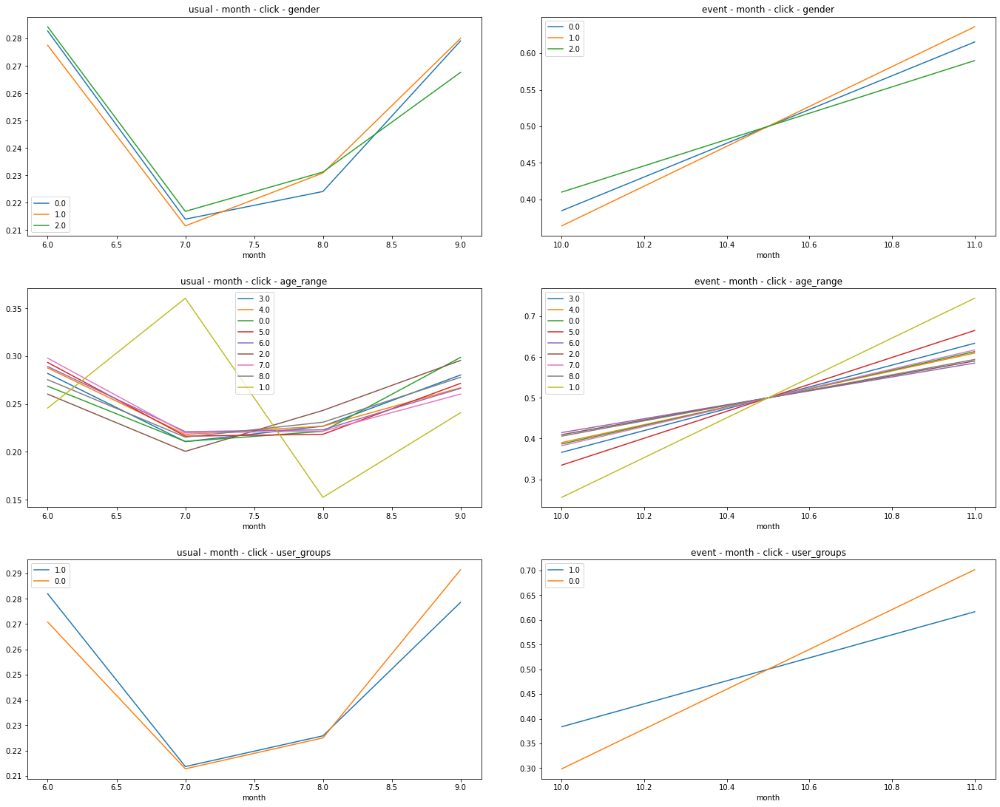

In [409]:
trend_lineplot(time_attr='month', amount='click')


> 從圖表做出解讀與推測：（仍需與業務單位進行認知確認）

```
(未有較為明顯的特徵)

```

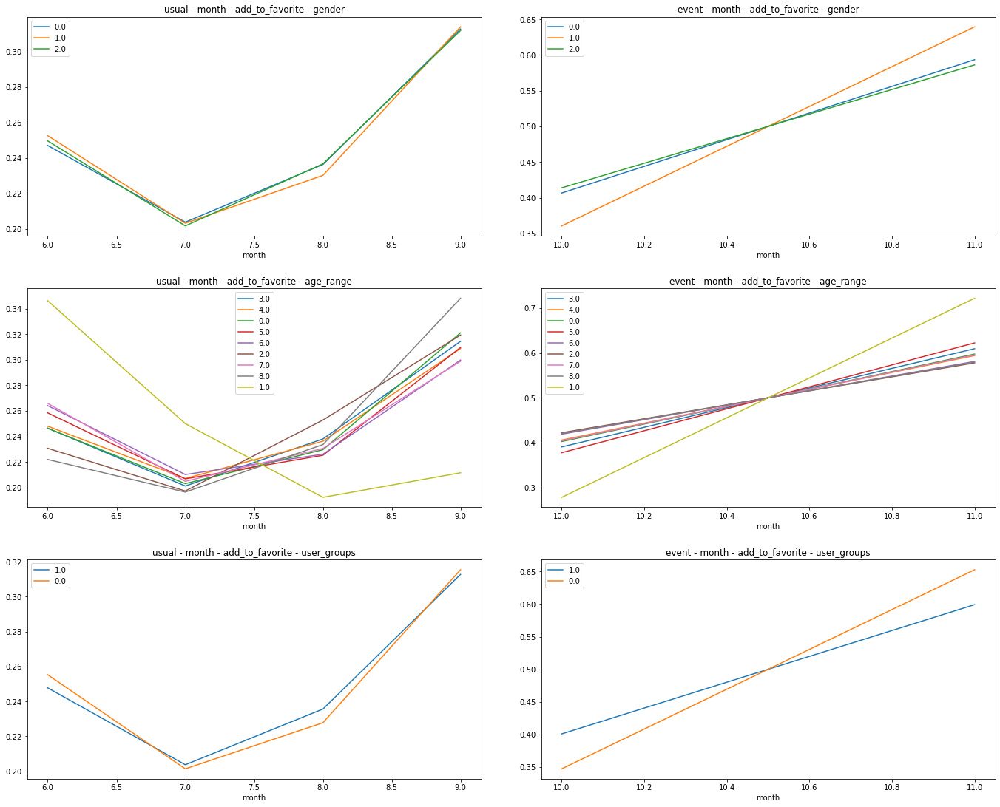

In [410]:
trend_lineplot(time_attr='month', amount='add_to_favorite')


> 從圖表做出解讀與推測：（仍需與業務單位進行認知確認）

```
(未有較為明顯的特徵)

```

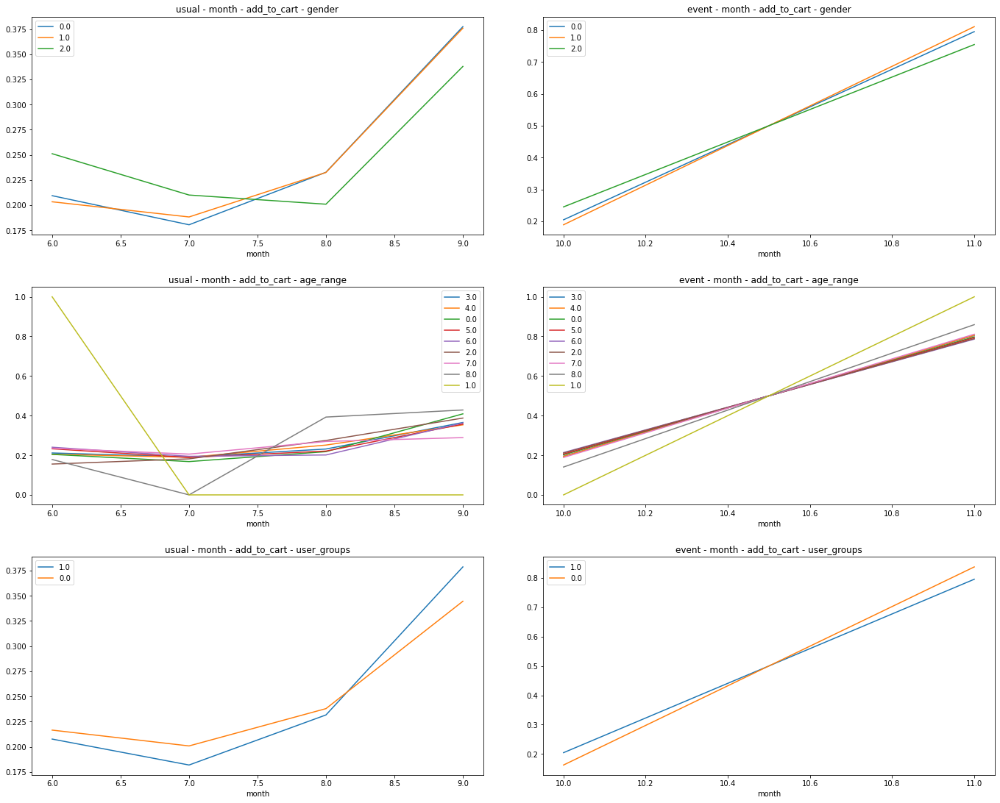

In [411]:
trend_lineplot(time_attr='month', amount='add_to_cart')


> 從圖表做出解讀與推測：（仍需與業務單位進行認知確認）

```
(未有較為明顯的特徵)

```

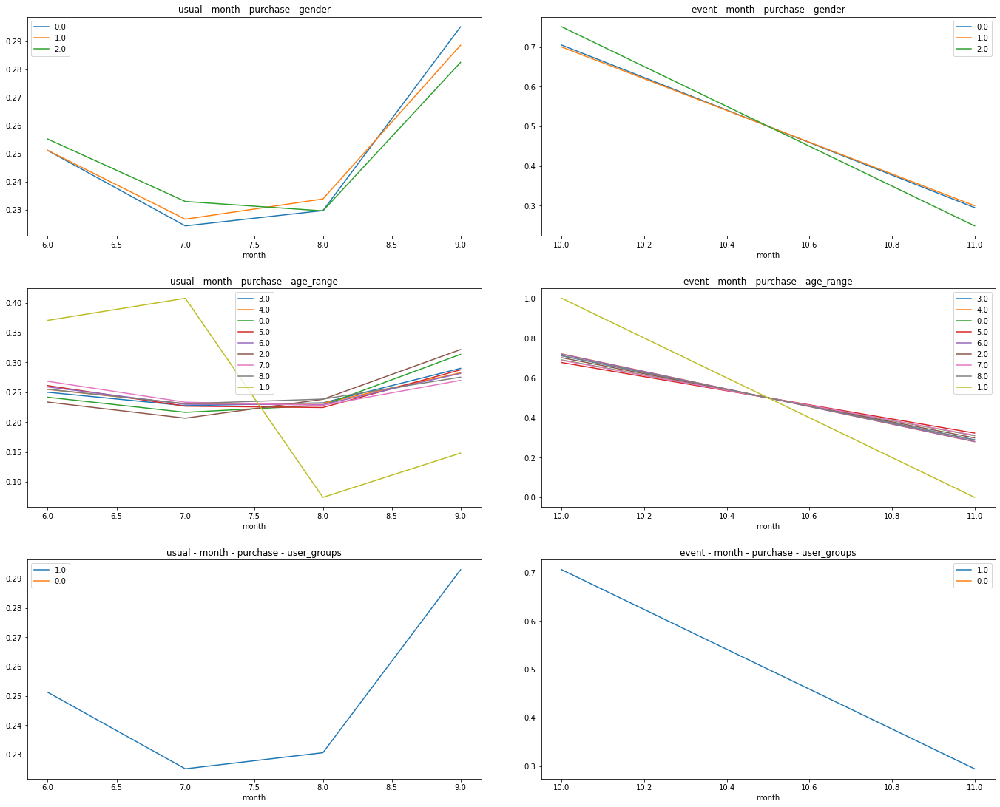

In [412]:
trend_lineplot(time_attr='month', amount='purchase')


> 從圖表做出解讀與推測：（仍需與業務單位進行認知確認）

```
(未有較為明顯的特徵)

```

> *P.S. 以組為觀察角度，一次觀察4種行為的消長*

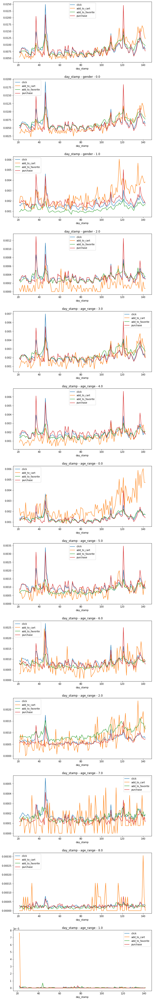

In [413]:
# None*1, gender*3, age_range*9
fig, axes = plt.subplots(1+3+9, figsize=(15, 60))
fig.tight_layout(pad = 5.0)
(df_usual.groupby('day_stamp')[['click','add_to_cart','add_to_favorite','purchase']].sum() / df_usual[['click','add_to_cart','add_to_favorite','purchase']].sum()).plot(ax=axes[0])
count = 1
for group_col in ['gender','age_range']:
    for cate in df[group_col].value_counts().index:
        (df_usual[df_usual[group_col]==cate].groupby('day_stamp')[['click','add_to_cart','add_to_favorite','purchase']].sum() / df_usual[['click','add_to_cart','add_to_favorite','purchase']].sum()).plot(ax=axes[count])
        axes[count].title.set_text(f'day_stamp - {group_col} - {cate}')
        count = count + 1
plt.show();


> 從圖表做出解讀與推測：

```
[day_stamp] 每日線

1. age_range
    - 0.0 組相對其他組別，更喜歡將商品加入購物車
    
```

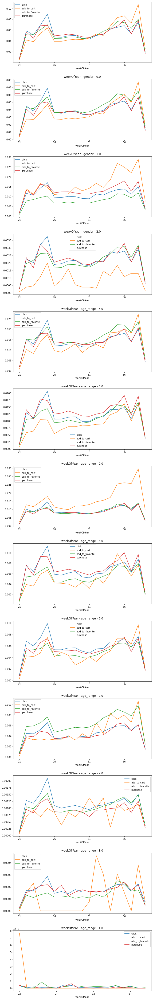

In [414]:
# None*1, gender*3, age_range*9
fig, axes = plt.subplots(1+3+9, figsize=(15, 60))
fig.tight_layout(pad = 5.0)
(df_usual.groupby('weekOfYear')[['click','add_to_cart','add_to_favorite','purchase']].sum() / df_usual[['click','add_to_cart','add_to_favorite','purchase']].sum()).plot(ax=axes[0])
count = 1
for group_col in ['gender','age_range']:
    for cate in df[group_col].value_counts().index:
        (df_usual[df_usual[group_col]==cate].groupby('weekOfYear')[['click','add_to_cart','add_to_favorite','purchase']].sum() / df_usual[['click','add_to_cart','add_to_favorite','purchase']].sum()).plot(ax=axes[count])
        axes[count].title.set_text(f'weekOfYear - {group_col} - {cate}')
        count = count + 1
plt.show();


> 從圖表做出解讀與推測：（仍需與業務單位進行認知確認）

```
(未有較為明顯的特徵)

```

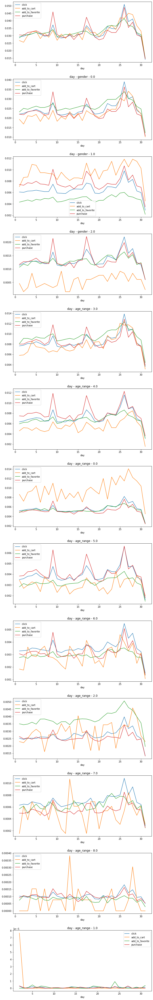

In [415]:
# None*1, gender*3, age_range*9
fig, axes = plt.subplots(1+3+9, figsize=(15, 60))
fig.tight_layout(pad = 5.0)
(df_usual.groupby('day')[['click','add_to_cart','add_to_favorite','purchase']].sum() / df_usual[['click','add_to_cart','add_to_favorite','purchase']].sum()).plot(ax=axes[0])
count = 1
for group_col in ['gender','age_range']:
    for cate in df[group_col].value_counts().index:
        (df_usual[df_usual[group_col]==cate].groupby('day')[['click','add_to_cart','add_to_favorite','purchase']].sum() / df_usual[['click','add_to_cart','add_to_favorite','purchase']].sum()).plot(ax=axes[count])
        axes[count].title.set_text(f'day - {group_col} - {cate}')
        count = count + 1
plt.show();


> 從圖表做出解讀與推測：

```
[day] 頻率：一個月中的30/31天
在6-9月中，購買集中在每月的9, 17, 26日；但也有可能是因為活動正好舉辦在那個日期，才造成高點
    
```

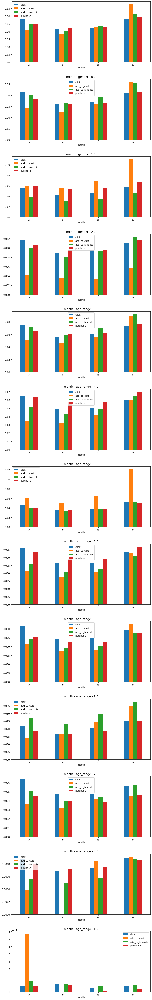

In [416]:
# None*1, gender*3, age_range*9
fig, axes = plt.subplots(1+3+9, figsize=(15, 60))
fig.tight_layout(pad = 5.0)
(df_usual.groupby('month')[['click','add_to_cart','add_to_favorite','purchase']].sum() / df_usual[['click','add_to_cart','add_to_favorite','purchase']].sum()).plot(ax=axes[0], kind='bar')
count = 1
for group_col in ['gender','age_range']:
    for cate in df[group_col].value_counts().index:
        (df_usual[df_usual[group_col]==cate].groupby('month')[['click','add_to_cart','add_to_favorite','purchase']].sum() / df_usual[['click','add_to_cart','add_to_favorite','purchase']].sum()).plot(ax=axes[count], kind='bar')
        axes[count].title.set_text(f'month - {group_col} - {cate}')
        count = count + 1
plt.show();


> 從圖表做出解讀與推測：（仍需與業務單位進行認知確認）

```
(同前)

```

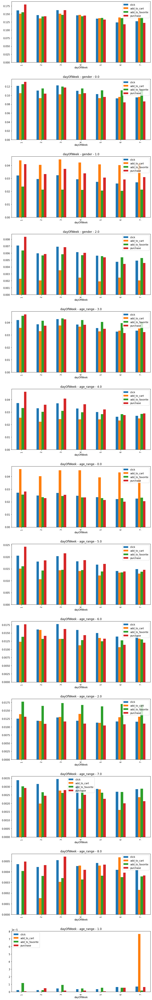

In [417]:
# None*1, gender*3, age_range*9
fig, axes = plt.subplots(1+3+9, figsize=(15, 60))
fig.tight_layout(pad = 5.0)
(df_usual.groupby('dayOfWeek')[['click','add_to_cart','add_to_favorite','purchase']].sum() / df_usual[['click','add_to_cart','add_to_favorite','purchase']].sum()).plot(ax=axes[0], kind='bar')
count = 1
for group_col in ['gender','age_range']:
    for cate in df[group_col].value_counts().index:
        (df_usual[df_usual[group_col]==cate].groupby('dayOfWeek')[['click','add_to_cart','add_to_favorite','purchase']].sum() / df_usual[['click','add_to_cart','add_to_favorite','purchase']].sum()).plot(ax=axes[count], kind='bar')
        axes[count].title.set_text(f'dayOfWeek - {group_col} - {cate}')
        count = count + 1
plt.show();


> 從圖表做出解讀與推測：（仍需與業務單位進行認知確認）

```
[dayOfWeek] 星期幾
6 - 9月各組的購買數以周一為最高，其次為周三

```

### 6. 各時間頻率下 {瀏覽/購買等行為}次數分布 – (1) 行為屬性
- day

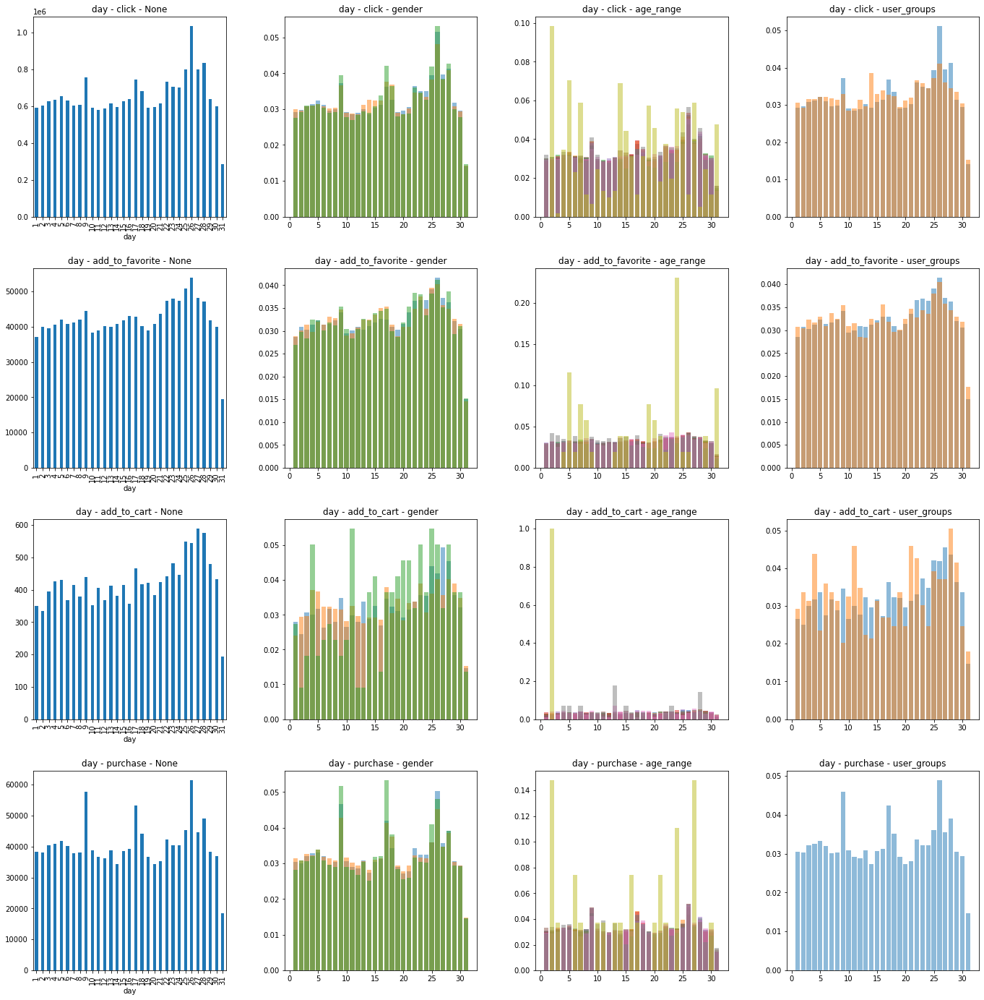

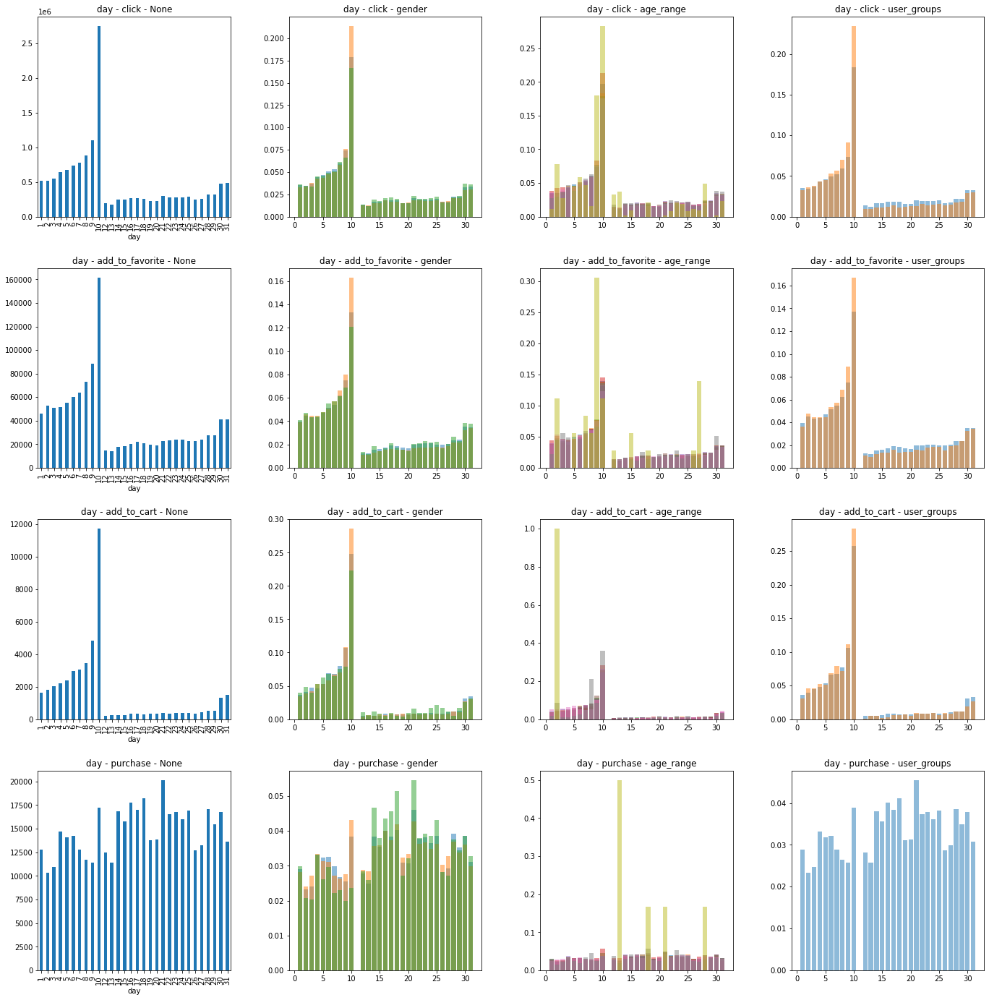

In [418]:
bar_subplot_time(df_usual, by='day', amount='event')


- dayOfWeek (星期幾)

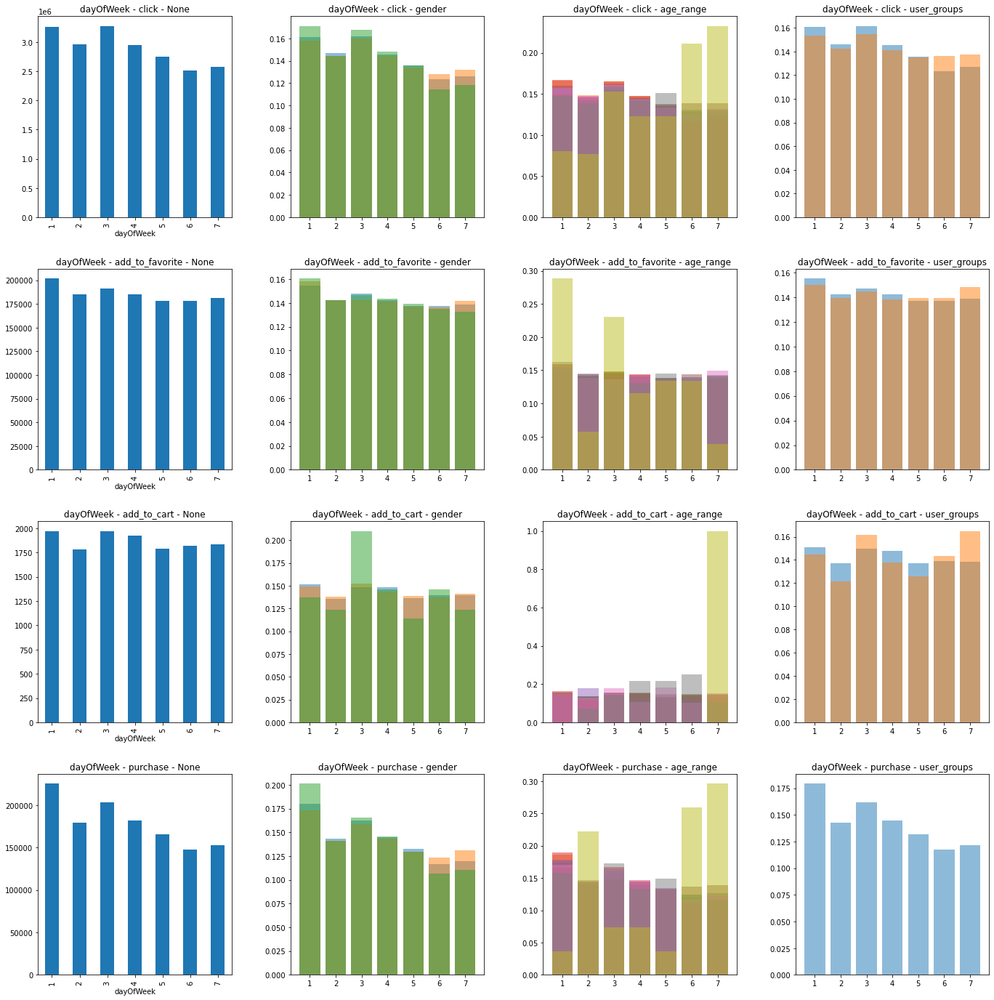

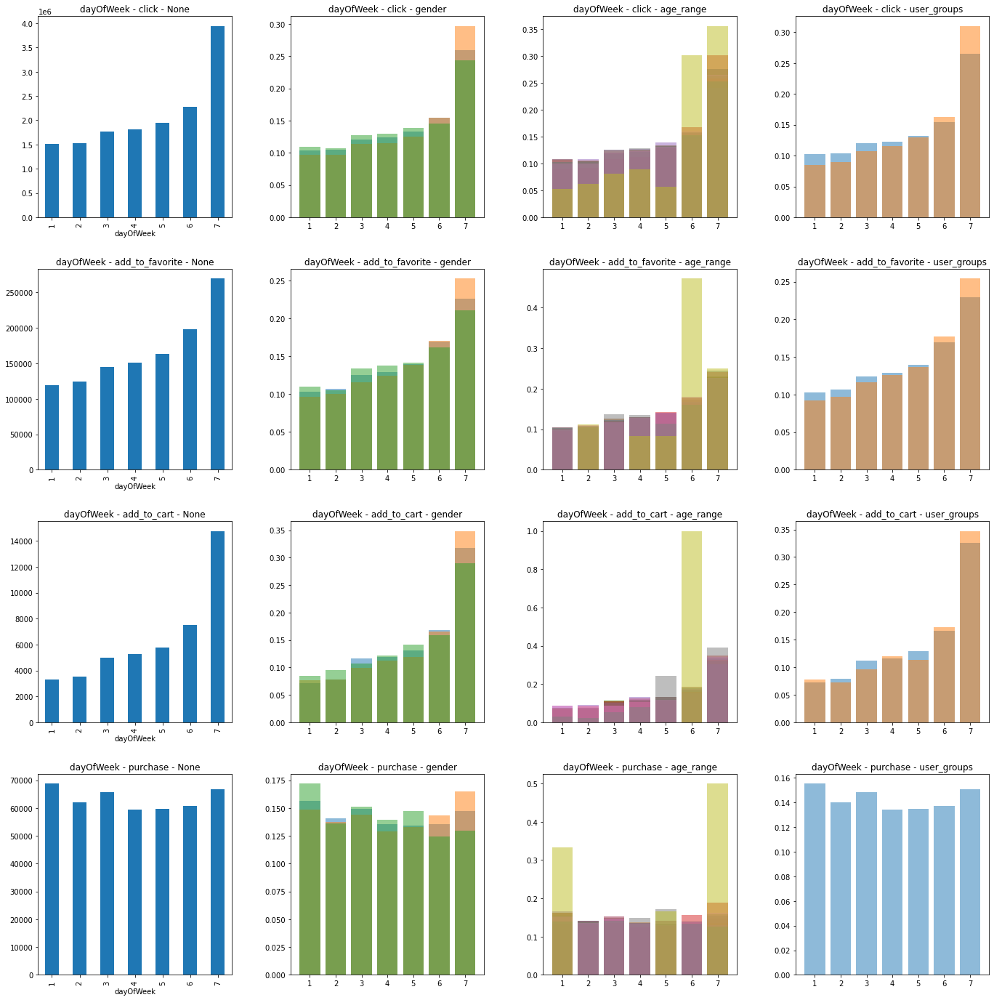

In [419]:
bar_subplot_time(df_usual, by='dayOfWeek', amount='event')
bar_subplot_time(df_event, by='dayOfWeek', amount='event')


- month

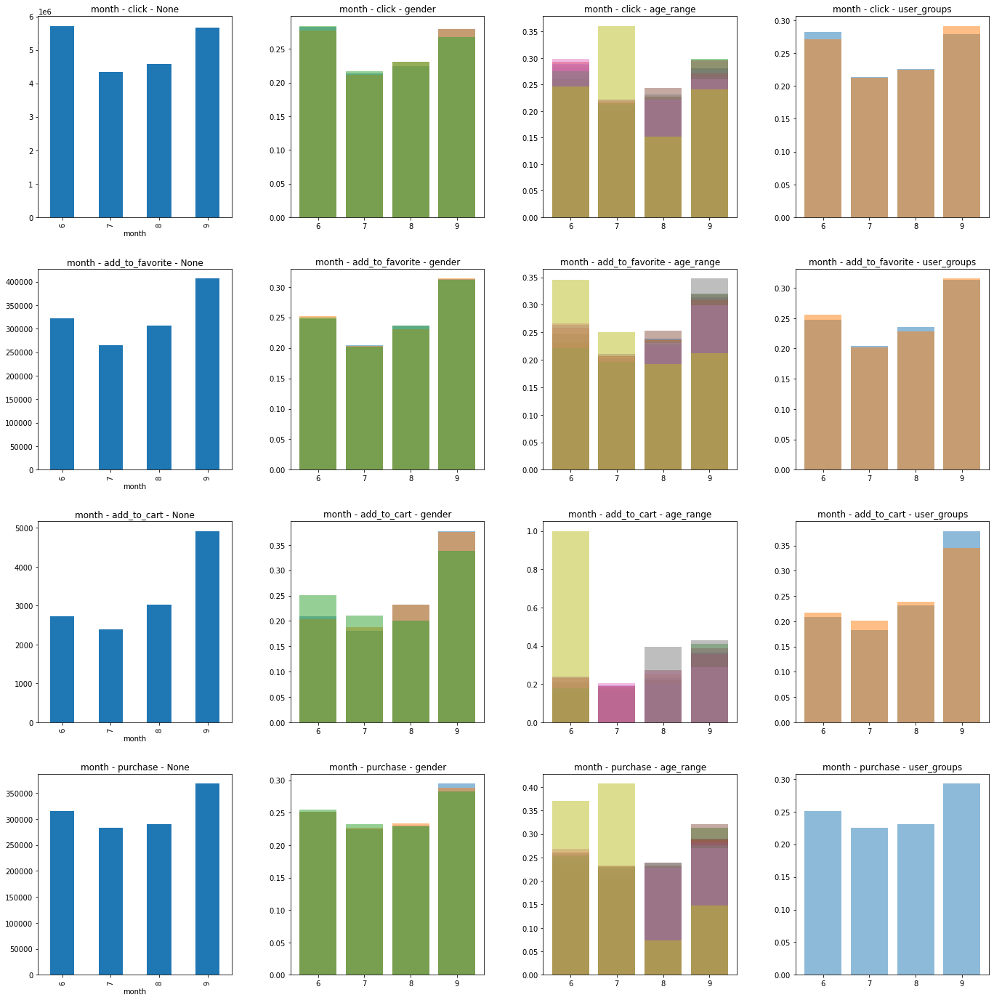

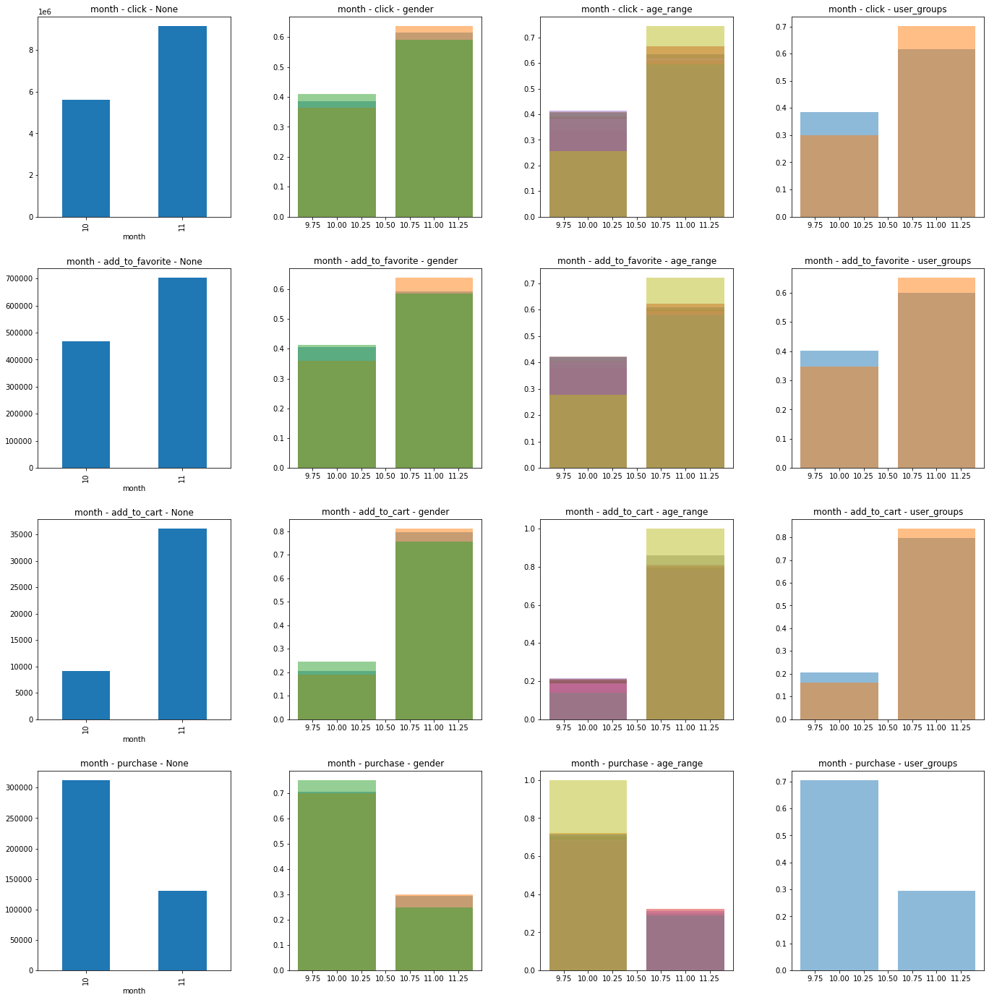

In [420]:
bar_subplot_time(df_usual, by='month', amount='event')
bar_subplot_time(df_event, by='month', amount='event')


- weekOfYear

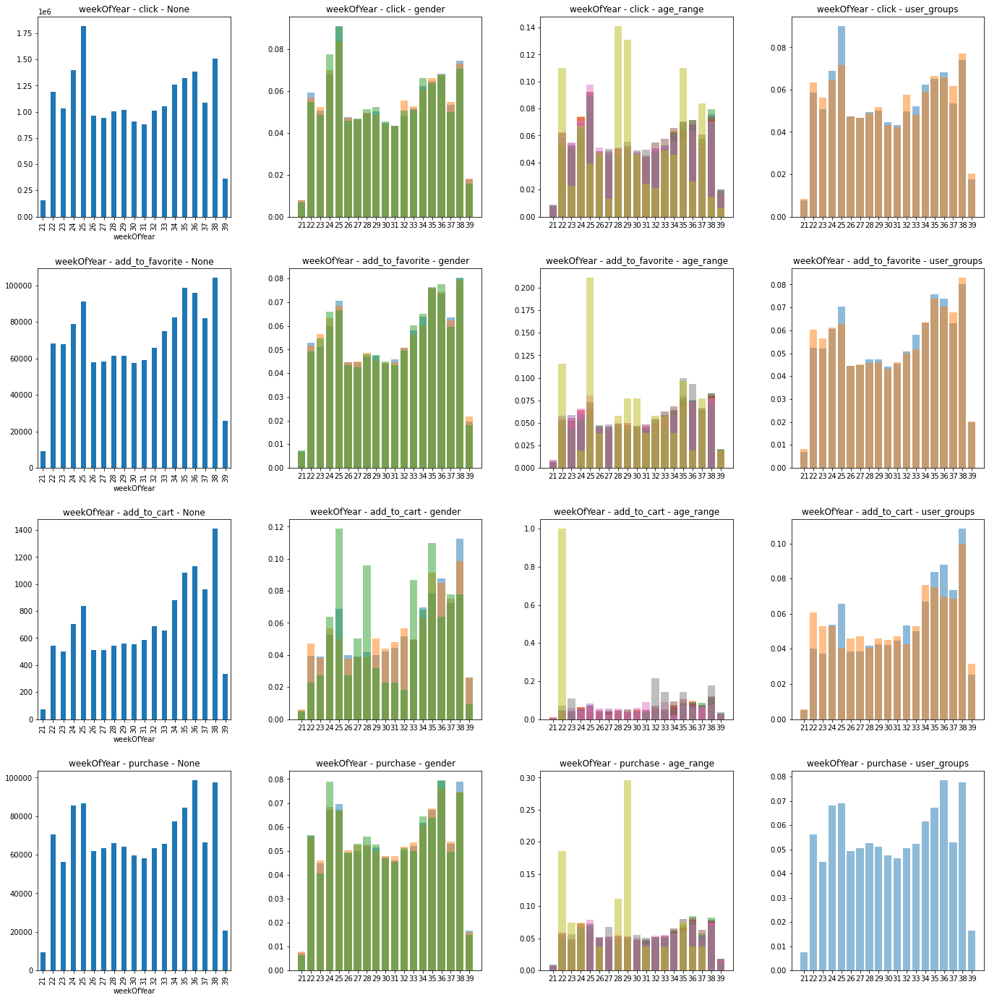

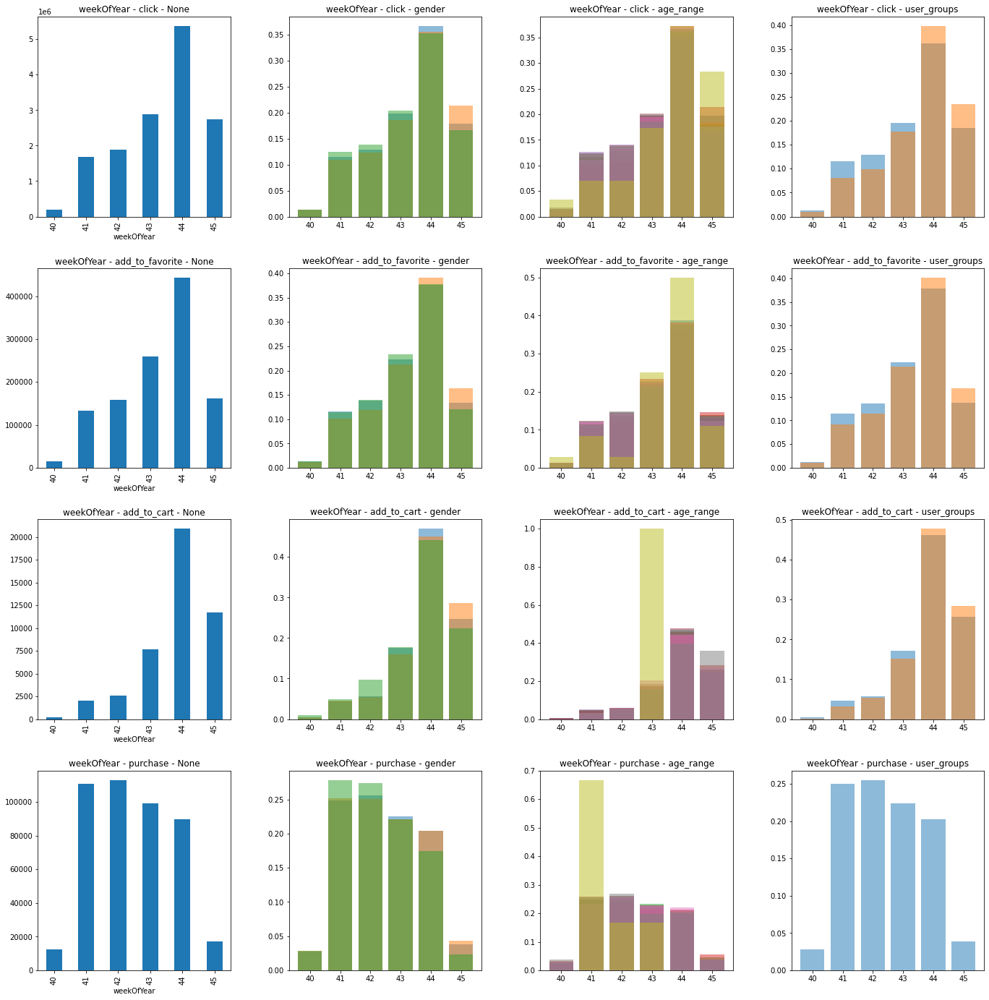

In [421]:
bar_subplot_time(df_usual, by='weekOfYear', amount='event')
bar_subplot_time(df_event, by='weekOfYear', amount='event')


### 5. 各時間頻率下 {瀏覽/購買等行為}次數分布 - (2) 商品屬性
- day


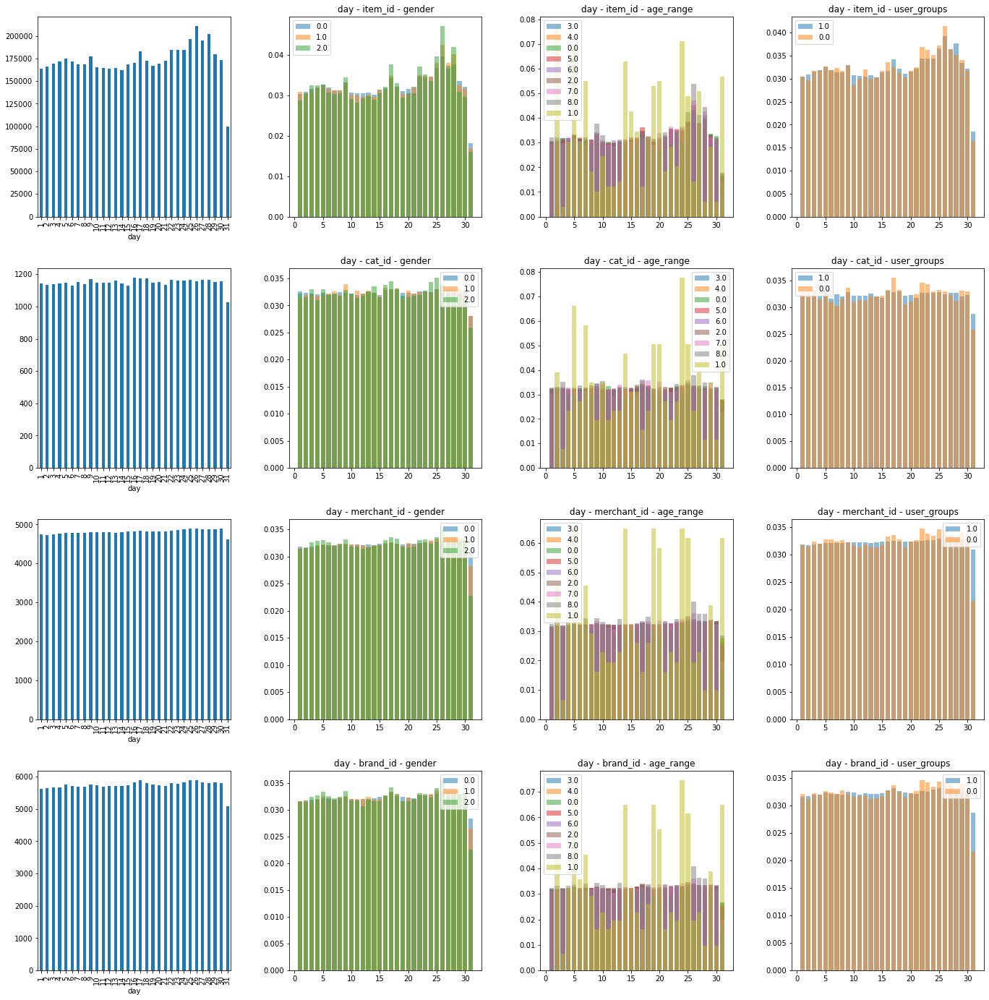

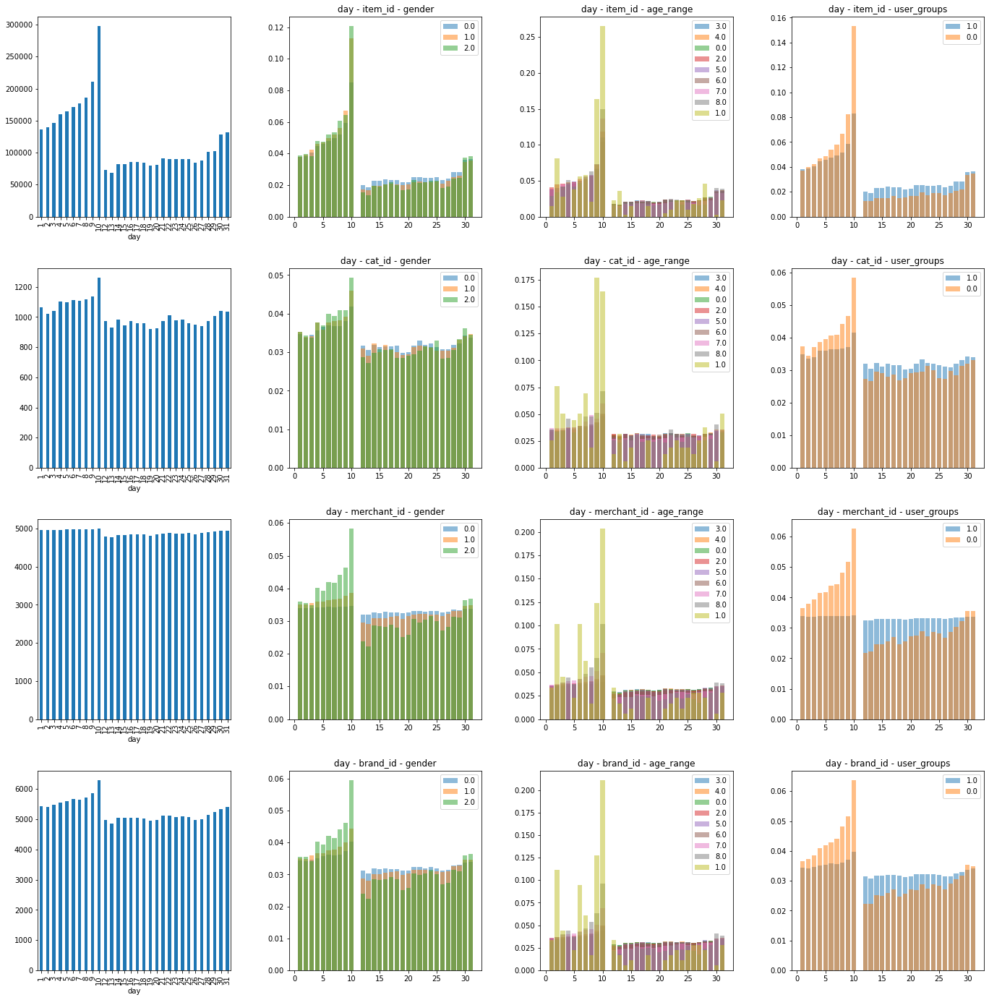

In [494]:
bar_subplot_time(df_usual, by='day', amount='product')
bar_subplot_time(df_event, by='day', amount='product')


- dayOfWeek (星期幾)

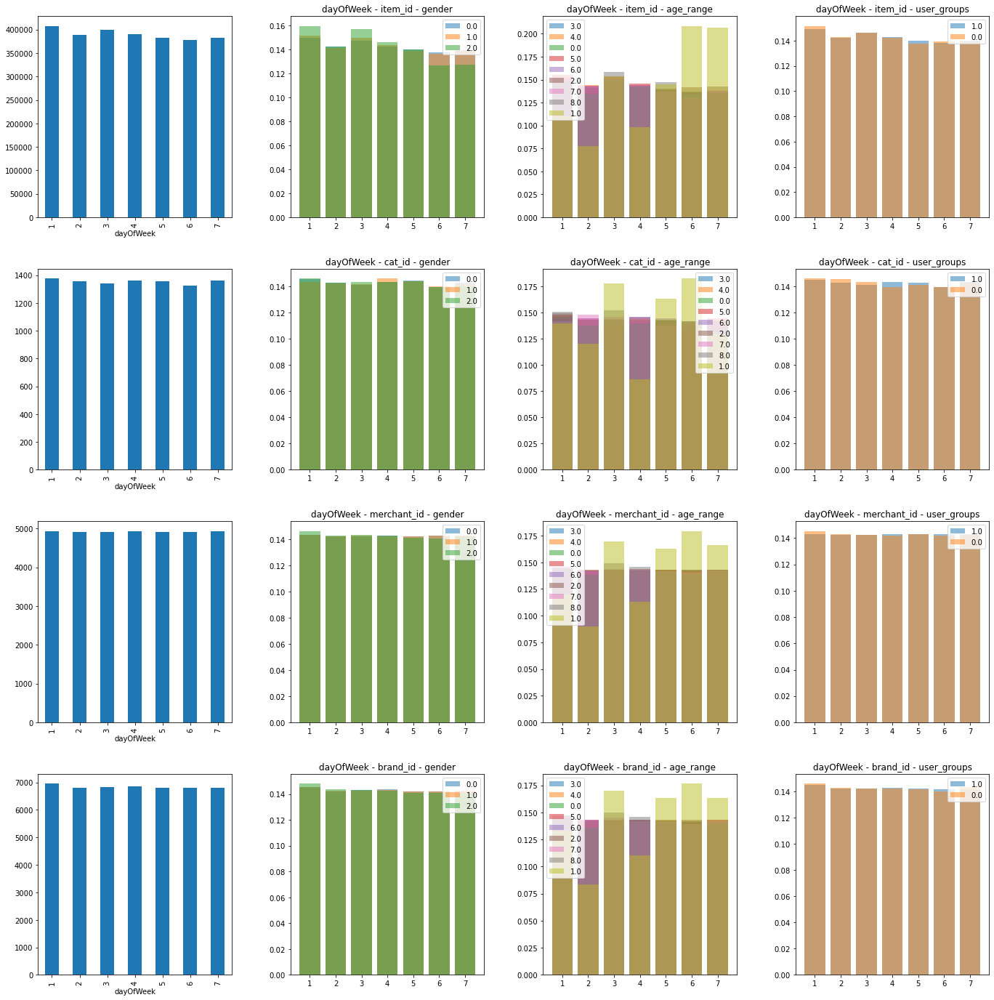

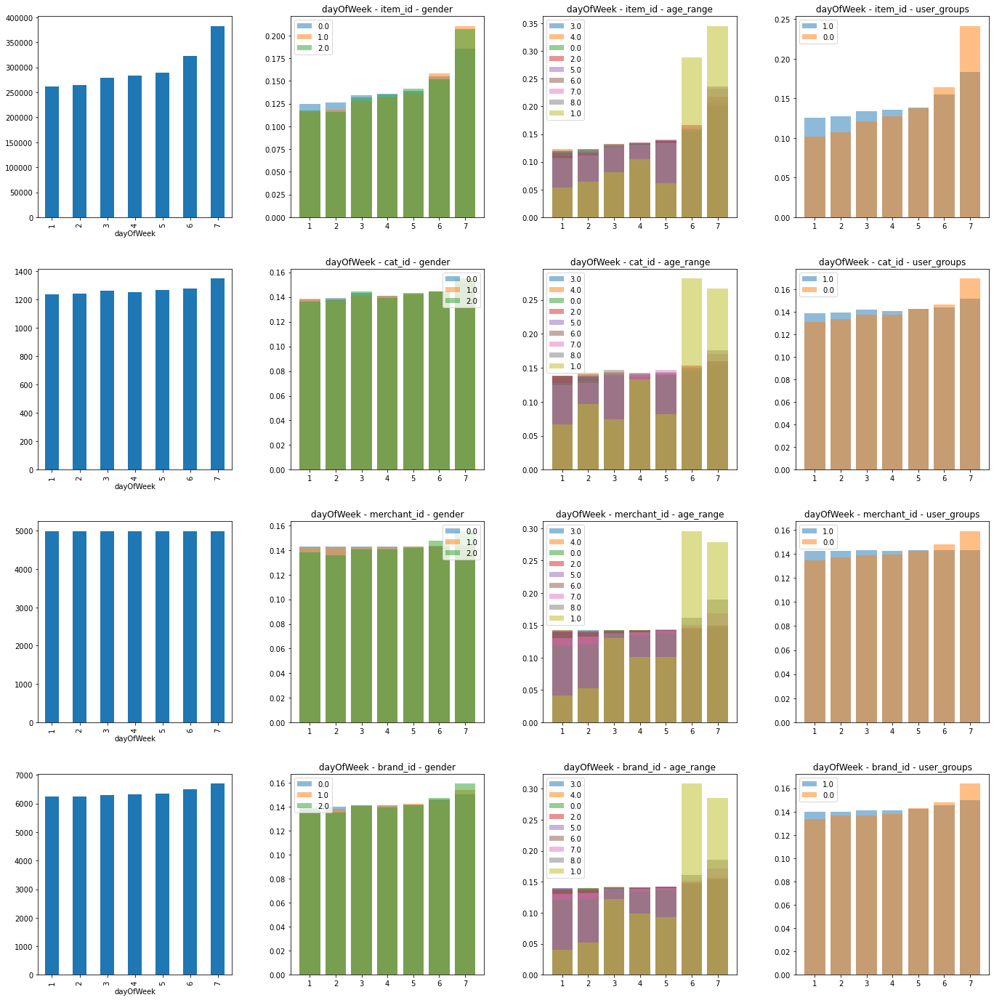

In [495]:
bar_subplot_time(df_usual, by='dayOfWeek', amount='product')
bar_subplot_time(df_event, by='dayOfWeek', amount='product')


- month

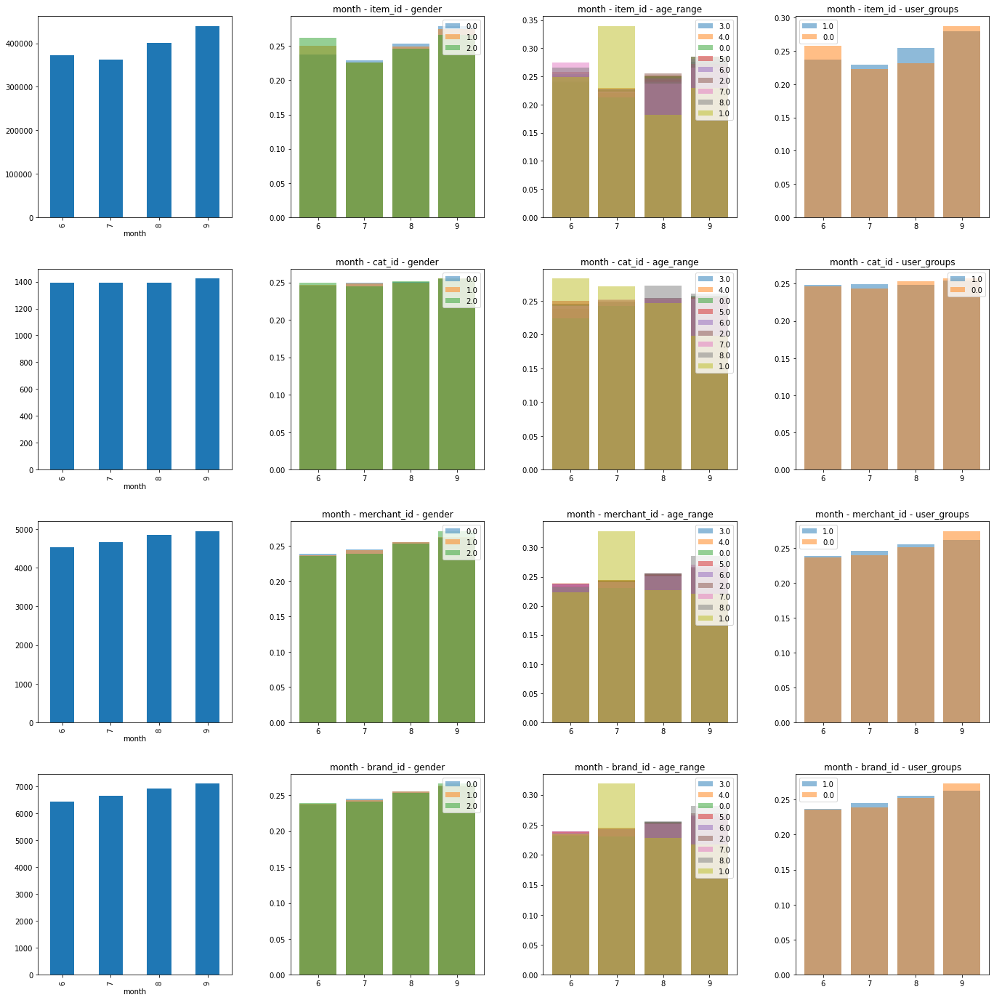

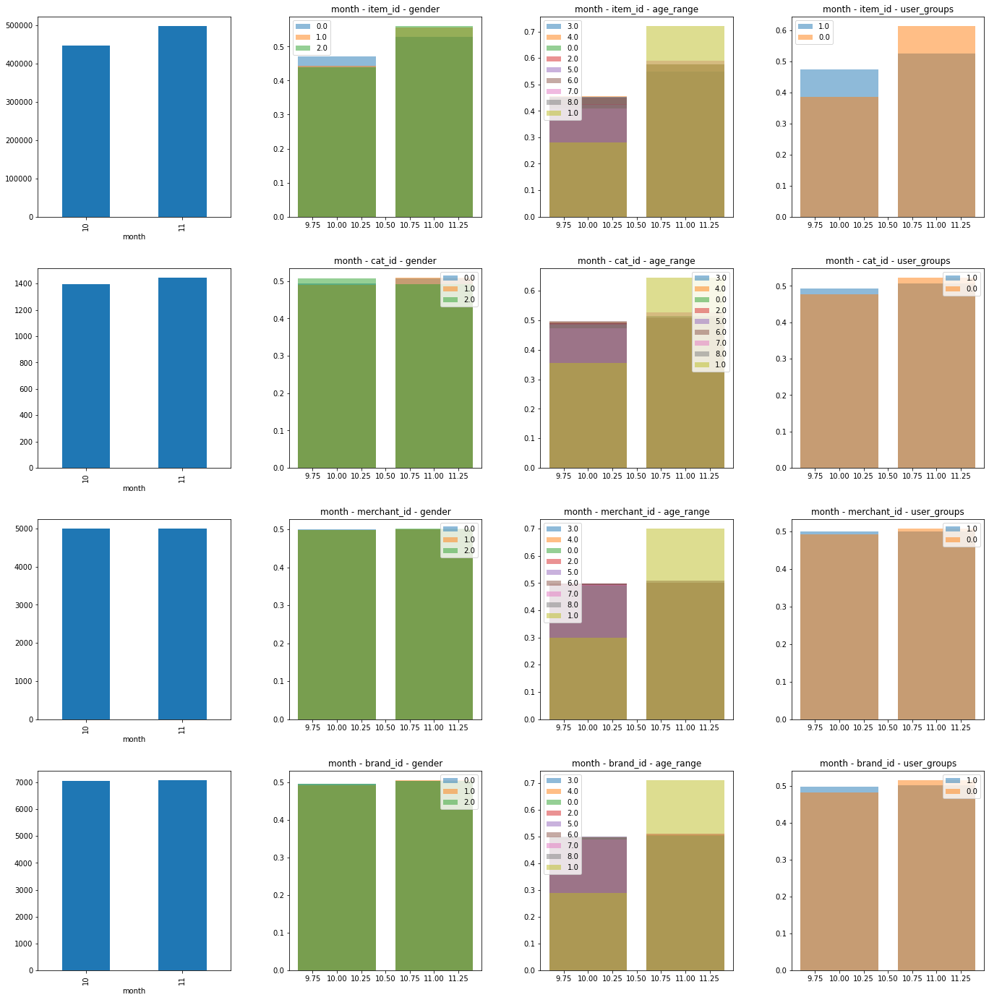

In [496]:
bar_subplot_time(df_usual, by='month', amount='product')
bar_subplot_time(df_event, by='month', amount='product')


- weekOfYear

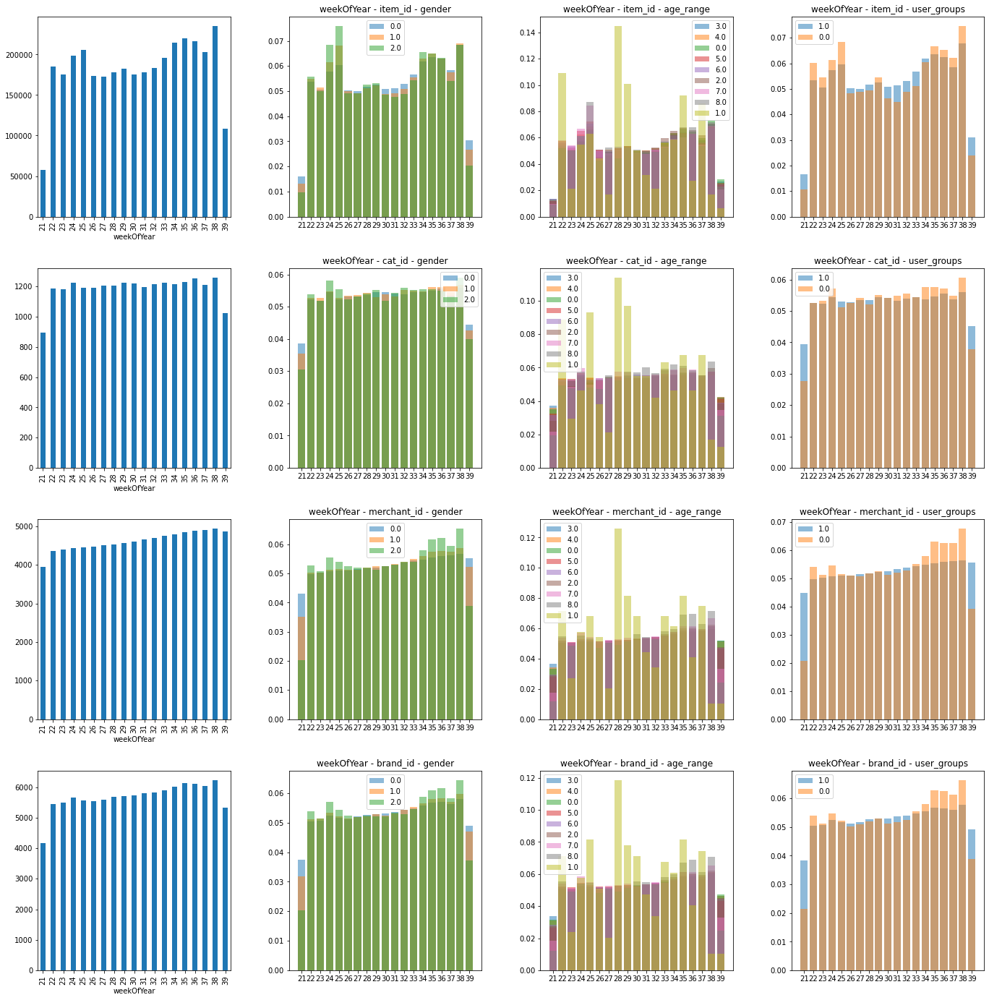

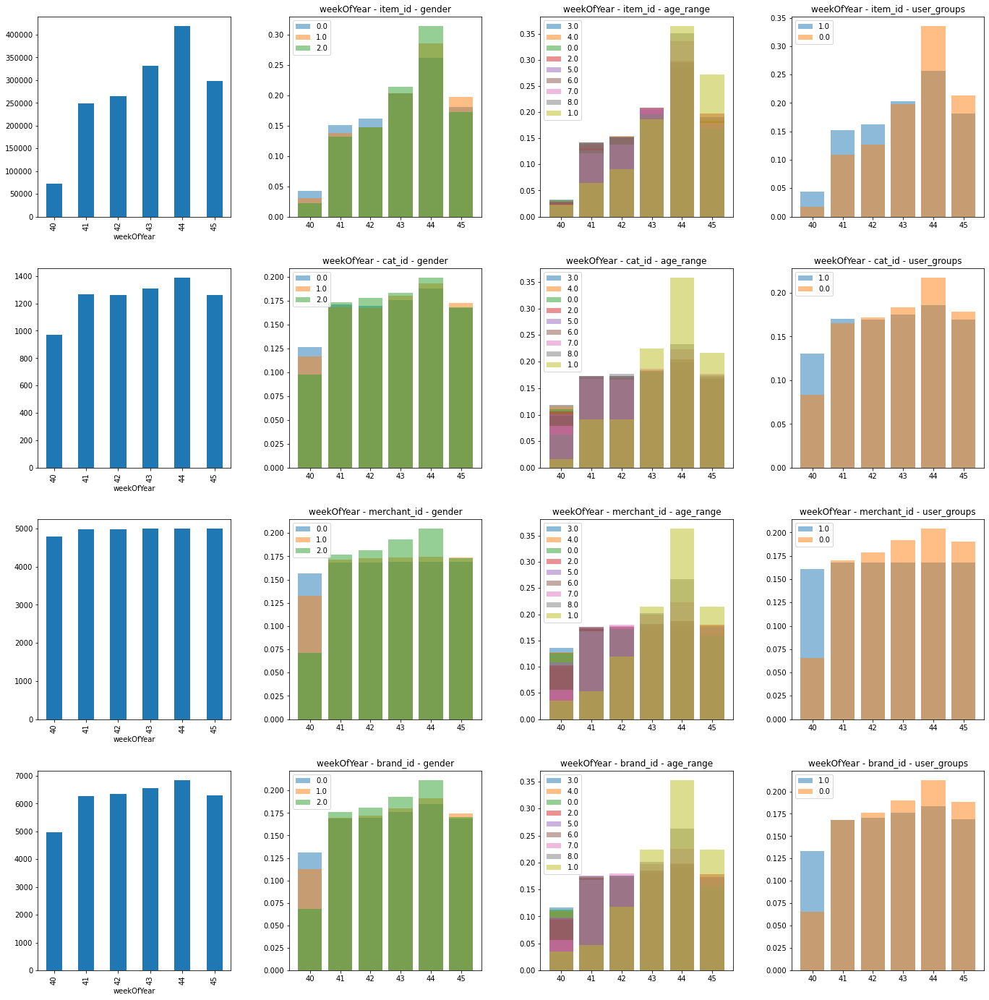

In [497]:
bar_subplot_time(df_usual, by='weekOfYear', amount='product')
bar_subplot_time(df_event, by='weekOfYear', amount='product')
